## Test Model 2030

In [358]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

#pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [359]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_IT\\20240319_IT3zeroem\\elec_s_3_ec_lv1.5_Co2L0.0-3h.nc")


INFO:pypsa.io:Imported network elec_s_3_ec_lv1.5_Co2L0.0-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [360]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 6 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 2 entries
Component 'Line' has 1 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 7 entries
Component 'Load' has 3 entries
Component 'Generator' has 44 entries
Component 'StorageUnit' has 9 entries
Component 'Store' has 3 entries


In [361]:
n.generators.loc['IT0 0 CCGT','marginal_cost']

46.81351362802638

In [362]:
# set marginal cost of load shedding to €
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 1000


In [363]:
#solve network
#n.optimize(solver_name='gurobi')
n.lopf(solver_name='gurobi')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2918086421.py:3: DeprecatedWarning: lopf is deprecated as of 0.24 and will be removed in 1.0. Use linopy-based function ``n.optimize()`` instead. Migrate extra functionalities: https://pypsa.readthedocs.io/en/latest/examples/optimization-with-linopy-migrate-extra-functionalities.html.
  n.lopf(solver_name='gurobi')
INFO:pypsa.linopf:Prepare linear problem


INFO:pypsa.linopf:Total preparation time: 4.94s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\pypsa-problem-4px97f8z.lp
Reading time = 2.71 seconds
obj: 531442 rows, 256989 columns, 997217 nonzeros
Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 531442 rows, 256989 columns and 997217 nonzeros
Model fingerprint: 0xf735a50b
Coefficient statistics:
  Matrix range     [1e-03, 8e+02]
  Objective range  [3e-02, 2e+05]
  Bounds range     [4e+00, 2e+09]
  RHS range        [3e+00, 1e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 398579 rows and 86220 columns
Presolve time: 0.76s
Presolved: 132863 rows, 170769 columns, 451103 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering t

INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+10


('ok', 'optimal')

In [364]:
def system_cost(n): #n.statistics.capex()
    tsc = n.statistics.capex() + n.statistics.opex()
    return tsc.droplevel(0).div(1e6) # million €/a

In [365]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


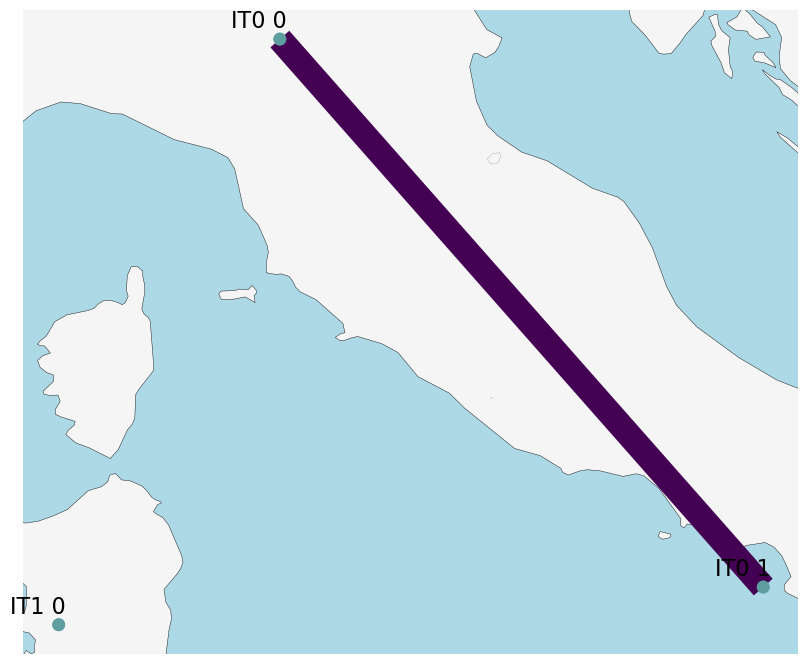

In [366]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [367]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


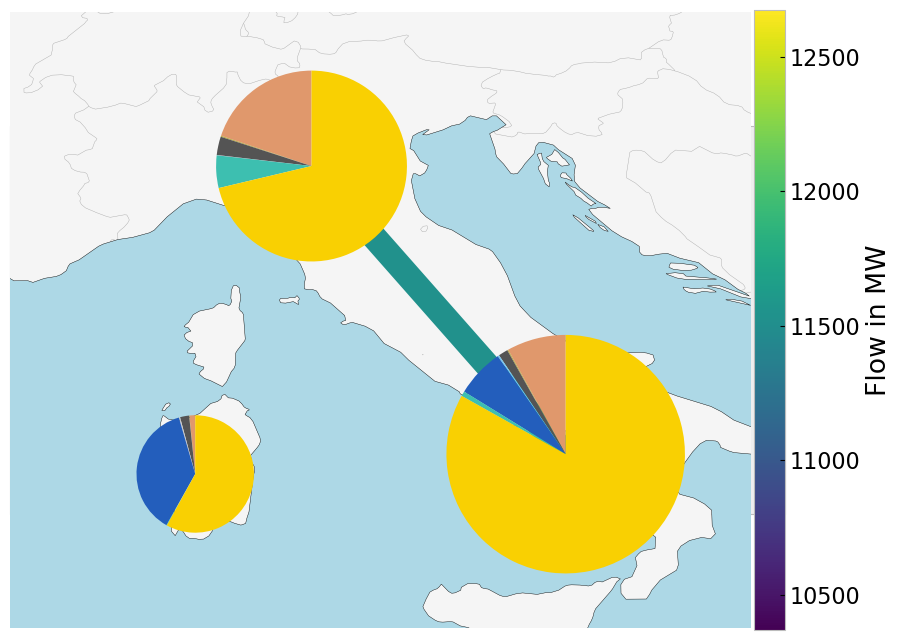

In [368]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [369]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3735415306.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


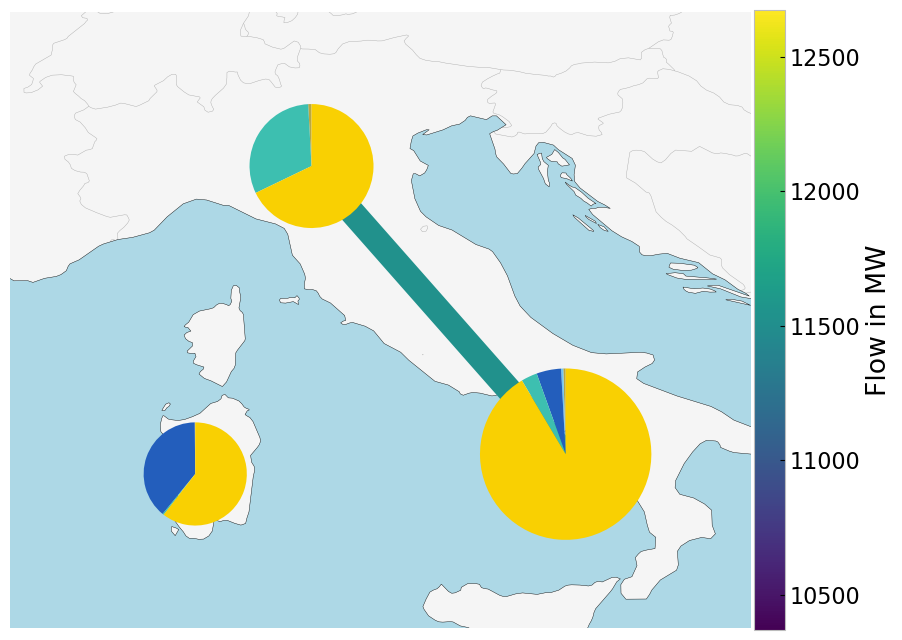

In [370]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

In [371]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity in Italy"
    )

    plt.show()
    return capacities

<Figure size 640x480 with 0 Axes>

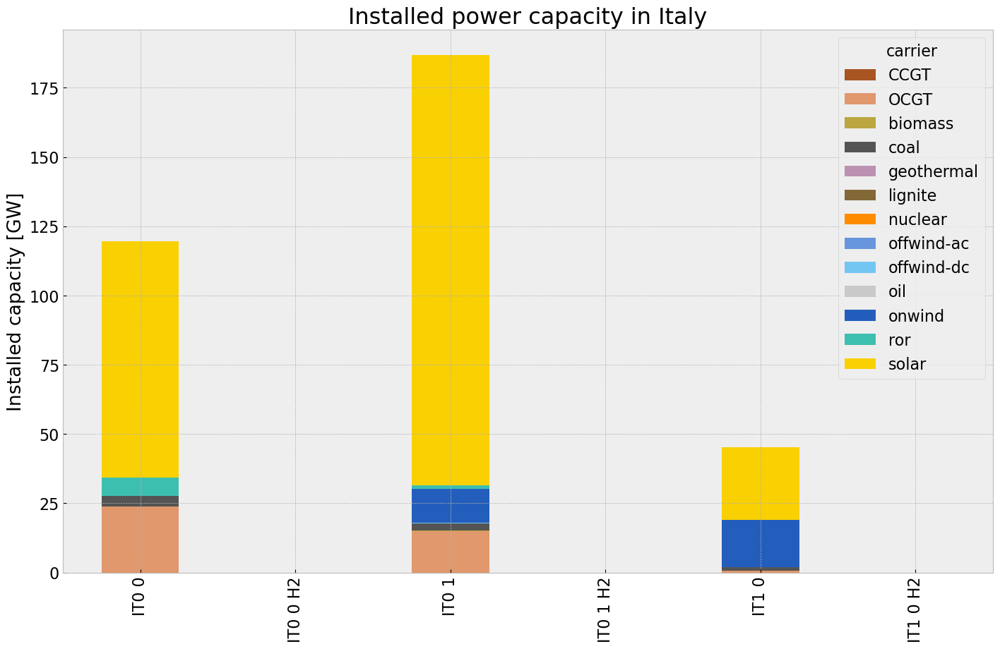

In [372]:
# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)


## Generation

In [373]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                #title=f"Generated electricity in Italy in {year}"
    )

    plt.show()
    return generations

<Figure size 640x480 with 0 Axes>

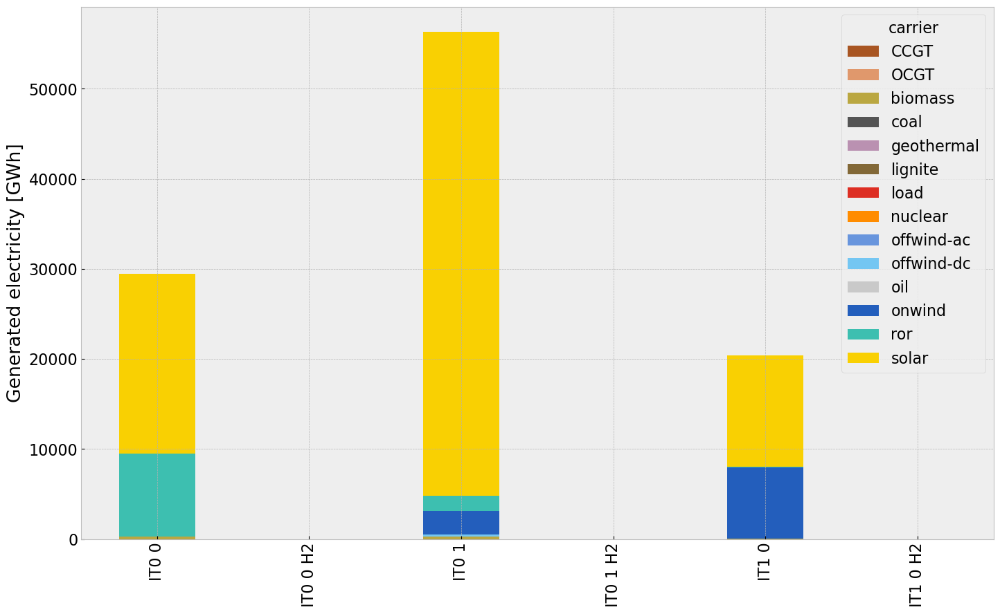

In [374]:

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [375]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2983392203.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2983392203.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [376]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [377]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)

    #links 
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1

    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,100)

In [378]:
p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)

#links 
links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)

links = links.drop(columns='DC', inplace=False)
links['H2 fuel cell']*=-1
    
if not n.storage_units.empty:
    sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
    p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2751733251.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2751733251.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2751733251.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2435897715.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2435897715.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].sum(axis=1).plot(ax=ax)


(20.0, 100.0)

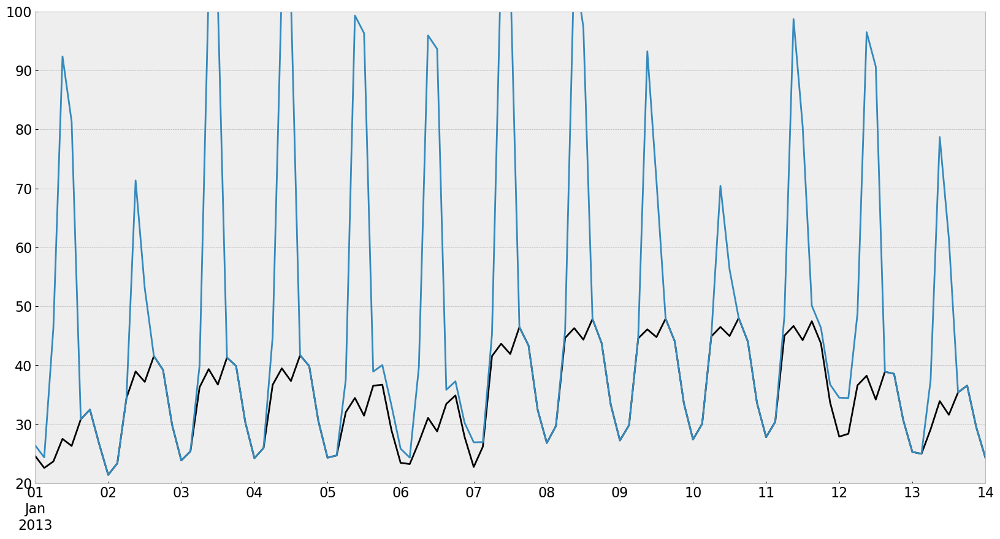

In [379]:
fig, ax = plt.subplots(figsize=(20, 10))
n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)
p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].sum(axis=1).plot(ax=ax)
ax.set_ylim(20,100)

In [380]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [381]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [382]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [383]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


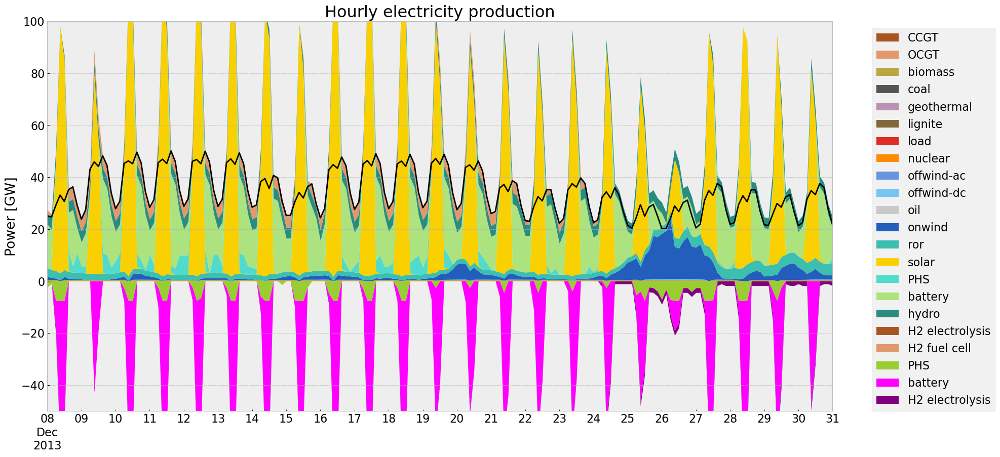

In [384]:
# winter
gen_curve(n, '2013-12-08', '2013-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


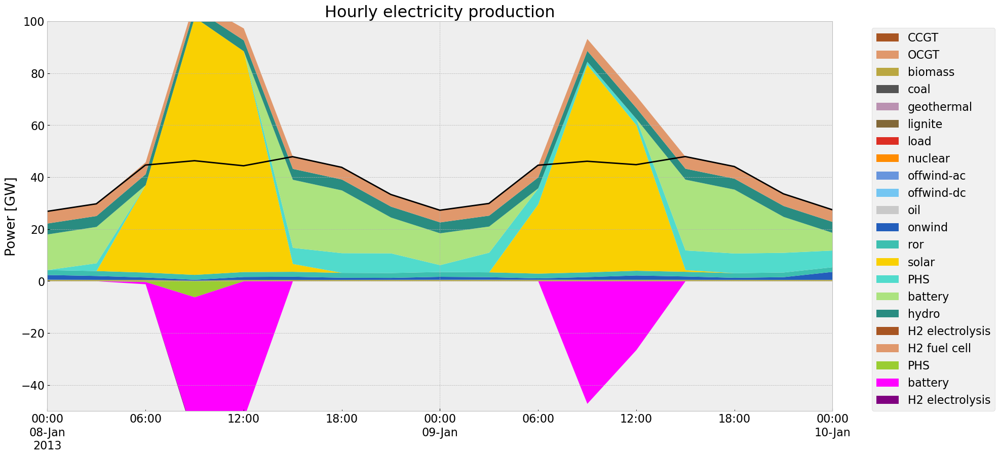

In [385]:

gen_curve(n, '2013-01-08', '2013-01-10', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


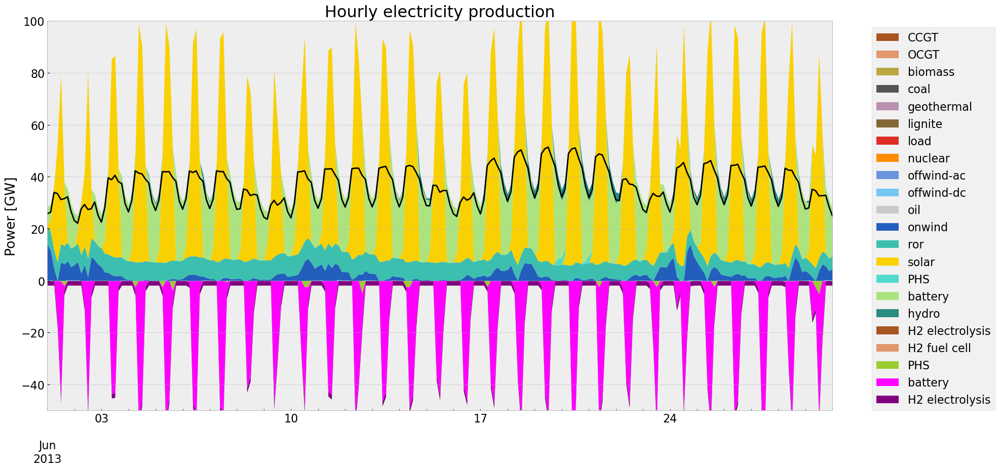

In [386]:
#summer
gen_curve(n, '2013-06-01', '2013-06-30', colors_gen)

## Storage

In [387]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,7.231472,3.5108
IT0 1,2.3960,37.396925,0.6060
IT1 0,0.2400,9.733295,0.0780


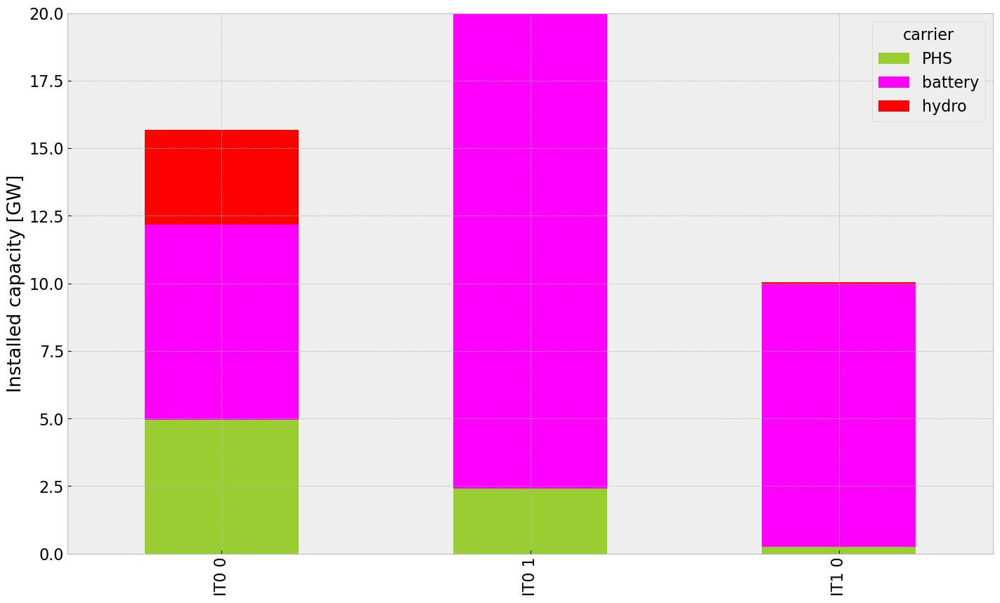

In [388]:
inst_store_table(n)

In [389]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
IT0 0 H2,5420.381918
IT0 1 H2,3107.554448
IT1 0 H2,0.000000


In [390]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,7500]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,7.231472,3.5108
IT0 1,2.3960,37.396925,0.6060
IT1 0,0.2400,9.733295,0.0780


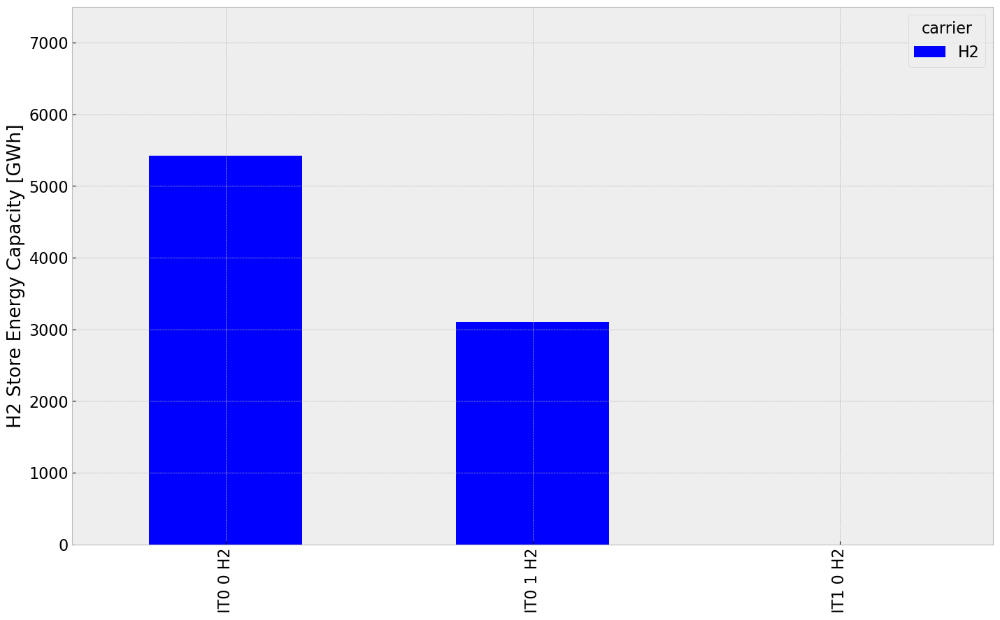

In [391]:
inst_storeh2_table(n)

In [392]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 H2,IT0 0 H2,H2,True,True,148.31893,0.010733,0,5.420382e+06,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
IT0 1 H2,IT0 1 H2,H2,True,True,148.31893,0.009501,0,3.107554e+06,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
IT1 0 H2,IT1 0 H2,H2,True,True,148.31893,0.009966,0,0.000000e+00,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [393]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


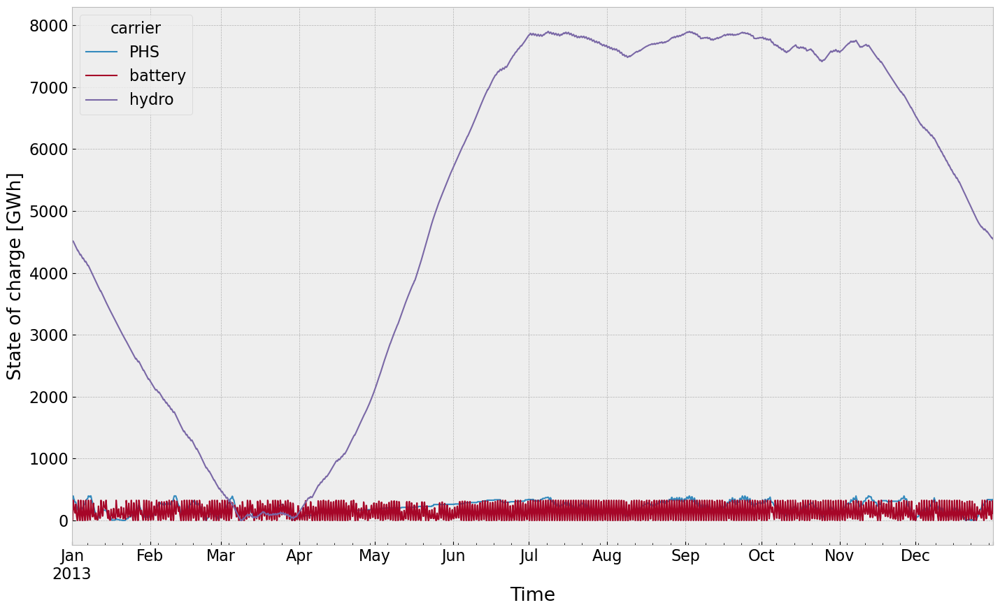

In [394]:
state_of_charge_plot(n)

## Electricity Price

In [395]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [396]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


In [397]:
n.buses_t.marginal_price['IT1 0'].sort_values(ascending=False).head(20)

snapshot
2013-01-10 03:00:00    1577.331285
2013-01-09 21:00:00    1577.331285
2013-01-09 18:00:00    1577.331285
2013-01-08 15:00:00    1577.331285
2013-01-08 18:00:00    1577.331285
2013-01-08 21:00:00    1577.331285
2013-01-09 00:00:00    1577.331285
2013-01-09 03:00:00    1577.331285
2013-01-09 06:00:00    1577.331285
2013-01-09 15:00:00    1577.331285
2013-01-10 06:00:00    1577.331285
2013-01-10 00:00:00    1577.331285
2013-01-09 12:00:00    1514.229376
2013-01-09 09:00:00    1514.228988
2013-01-14 18:00:00     963.143732
2013-01-14 15:00:00     963.143732
2013-01-15 06:00:00     963.143732
2013-01-15 03:00:00     963.143732
2013-01-15 00:00:00     963.143732
2013-01-14 21:00:00     963.143732
Name: IT1 0, dtype: float64

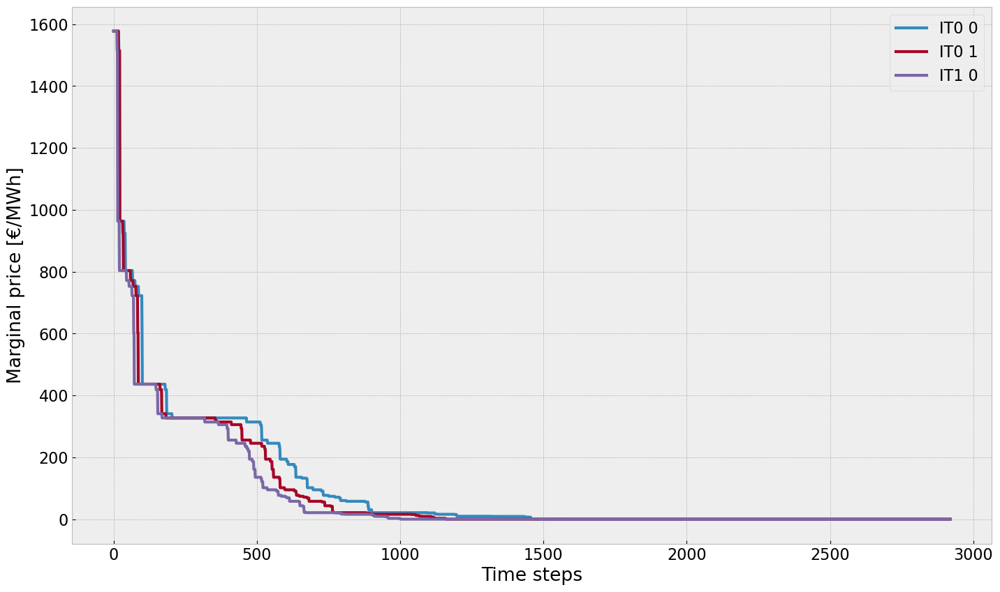

In [398]:
price_dur_curve_plot(n)

In [399]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

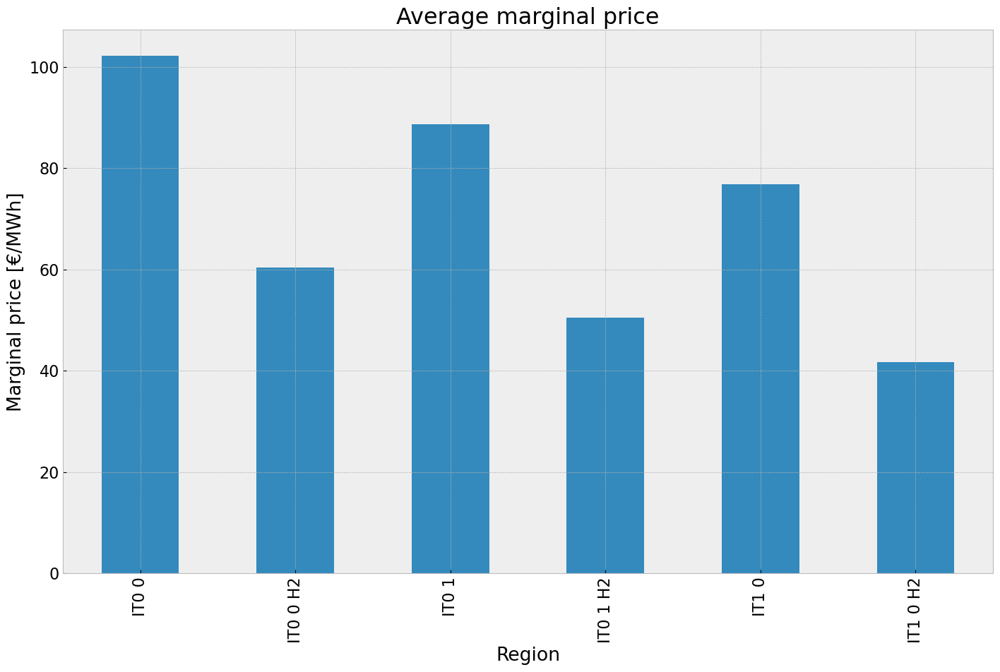

In [400]:
price_regions_table(n)

# Volcano Erruption Scenario
eruption start: 01.06.2013
reduction on radiation: 10%, source:
duration : until year end

In [401]:
#copy network
n1=n.copy()

#p_max_pu of solar generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
eruption_start=pd.to_datetime('2013-06-01 00:00:00')
for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= eruption_start:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.9 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

In [402]:
n1.generators_t.p_max_pu.sum()

Generator
IT0 0 offwind-ac     487.384979
IT0 0 offwind-dc     604.391882
IT0 0 onwind         142.342859
IT0 0 ror           1398.010907
IT0 0 solar          382.740666
IT0 1 offwind-ac     540.778674
IT0 1 offwind-dc     858.589210
IT0 1 onwind         299.740456
IT0 1 ror           1398.010907
IT0 1 solar          437.904781
IT1 0 offwind-ac     811.941052
IT1 0 onwind         565.816181
IT1 0 ror           1398.010907
IT1 0 solar          440.702972
dtype: float64

## 1. Scenario: allow additional investment of extendable generators and storage

In [403]:
n1.optimize.create_model()


Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [404]:
#solve network

n1.optimize(solver_name='gurobi')

Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')
Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00, 14.15it/s]
INFO:linopy.io: Writing time: 7.17s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70nbipua.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70nbipua.lp


Reading time = 2.37 seconds


INFO:gurobipy:Reading time = 2.37 seconds


obj: 531483 rows, 256950 columns, 997219 nonzeros


INFO:gurobipy:obj: 531483 rows, 256950 columns, 997219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 531483 rows, 256950 columns and 997219 nonzeros


INFO:gurobipy:Optimize a model with 531483 rows, 256950 columns and 997219 nonzeros


Model fingerprint: 0x71074f6a


INFO:gurobipy:Model fingerprint: 0x71074f6a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 401426 rows and 86182 columns


INFO:gurobipy:Presolve removed 401426 rows and 86182 columns


Presolve time: 0.93s


INFO:gurobipy:Presolve time: 0.93s


Presolved: 130057 rows, 170768 columns, 445491 nonzeros


INFO:gurobipy:Presolved: 130057 rows, 170768 columns, 445491 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.20s


INFO:gurobipy:Ordering time: 0.20s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 24


INFO:gurobipy: Dense cols : 24


 AA' NZ     : 3.185e+05


INFO:gurobipy: AA' NZ     : 3.185e+05


 Factor NZ  : 2.074e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.074e+06 (roughly 140 MB of memory)


 Factor Ops : 5.805e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 5.805e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.01078766e+16 -6.14356908e+16  4.40e+07 3.80e+05  2.56e+12     2s


INFO:gurobipy:   0   6.01078766e+16 -6.14356908e+16  4.40e+07 3.80e+05  2.56e+12     2s


   1   4.91845566e+16 -2.88085798e+16  3.51e+07 1.11e+05  1.43e+12     2s


INFO:gurobipy:   1   4.91845566e+16 -2.88085798e+16  3.51e+07 1.11e+05  1.43e+12     2s


   2   3.82954905e+16 -1.51526000e+16  2.68e+07 3.15e+04  9.25e+11     2s


INFO:gurobipy:   2   3.82954905e+16 -1.51526000e+16  2.68e+07 3.15e+04  9.25e+11     2s


   3   1.80831942e+16 -9.84263987e+15  1.12e+07 1.46e+04  4.00e+11     2s


INFO:gurobipy:   3   1.80831942e+16 -9.84263987e+15  1.12e+07 1.46e+04  4.00e+11     2s


   4   8.70833486e+15 -5.04124652e+15  5.04e+06 4.09e+03  1.75e+11     2s


INFO:gurobipy:   4   8.70833486e+15 -5.04124652e+15  5.04e+06 4.09e+03  1.75e+11     2s


   5   3.70411690e+15 -3.28360547e+15  2.09e+06 1.85e+03  7.51e+10     3s


INFO:gurobipy:   5   3.70411690e+15 -3.28360547e+15  2.09e+06 1.85e+03  7.51e+10     3s


   6   1.57658383e+15 -2.05649446e+15  8.74e+05 8.16e+02  3.26e+10     3s


INFO:gurobipy:   6   1.57658383e+15 -2.05649446e+15  8.74e+05 8.16e+02  3.26e+10     3s


   7   4.59587509e+14 -1.21870166e+15  2.52e+05 3.41e+02  1.10e+10     3s


INFO:gurobipy:   7   4.59587509e+14 -1.21870166e+15  2.52e+05 3.41e+02  1.10e+10     3s


   8   2.16724588e+14 -4.47244465e+14  1.18e+05 5.68e+01  4.14e+09     3s


INFO:gurobipy:   8   2.16724588e+14 -4.47244465e+14  1.18e+05 5.68e+01  4.14e+09     3s


   9   1.09997346e+14 -1.98146571e+14  6.00e+04 7.48e+00  1.81e+09     3s


INFO:gurobipy:   9   1.09997346e+14 -1.98146571e+14  6.00e+04 7.48e+00  1.81e+09     3s


  10   3.87161197e+12 -6.63384626e+13  1.38e+03 8.62e-01  2.11e+08     4s


INFO:gurobipy:  10   3.87161197e+12 -6.63384626e+13  1.38e+03 8.62e-01  2.11e+08     4s


  11   1.69920201e+12 -9.85397995e+12  5.42e+02 1.16e-01  3.36e+07     4s


INFO:gurobipy:  11   1.69920201e+12 -9.85397995e+12  5.42e+02 1.16e-01  3.36e+07     4s


  12   5.66164137e+11 -3.29062461e+12  1.28e+02 3.56e-02  1.08e+07     4s


INFO:gurobipy:  12   5.66164137e+11 -3.29062461e+12  1.28e+02 3.56e-02  1.08e+07     4s


  13   3.20997787e+11 -2.04586011e+12  5.45e+01 2.19e-02  6.58e+06     4s


INFO:gurobipy:  13   3.20997787e+11 -2.04586011e+12  5.45e+01 2.19e-02  6.58e+06     4s


  14   2.70412247e+11 -1.47805196e+12  4.50e+01 1.57e-02  4.85e+06     4s


INFO:gurobipy:  14   2.70412247e+11 -1.47805196e+12  4.50e+01 1.57e-02  4.85e+06     4s


  15   1.83347625e+11 -9.37765749e+11  2.53e+01 1.01e-02  3.10e+06     4s


INFO:gurobipy:  15   1.83347625e+11 -9.37765749e+11  2.53e+01 1.01e-02  3.10e+06     4s


  16   1.07555885e+11 -2.07174337e+11  1.15e+01 2.25e-03  8.68e+05     5s


INFO:gurobipy:  16   1.07555885e+11 -2.07174337e+11  1.15e+01 2.25e-03  8.68e+05     5s


  17   7.16579754e+10 -6.56633516e+10  6.38e+00 8.01e-04  3.78e+05     5s


INFO:gurobipy:  17   7.16579754e+10 -6.56633516e+10  6.38e+00 8.01e-04  3.78e+05     5s


  18   6.15539760e+10 -2.04459351e+10  5.12e+00 3.82e-04  2.26e+05     5s


INFO:gurobipy:  18   6.15539760e+10 -2.04459351e+10  5.12e+00 3.82e-04  2.26e+05     5s


  19   5.47405653e+10 -1.31986592e+10  4.26e+00 3.10e-04  1.87e+05     5s


INFO:gurobipy:  19   5.47405653e+10 -1.31986592e+10  4.26e+00 3.10e-04  1.87e+05     5s


  20   4.95014316e+10 -5.95813433e+09  3.60e+00 2.39e-04  1.53e+05     6s


INFO:gurobipy:  20   4.95014316e+10 -5.95813433e+09  3.60e+00 2.39e-04  1.53e+05     6s


  21   4.22266499e+10 -8.84035897e+08  2.69e+00 1.90e-04  1.19e+05     6s


INFO:gurobipy:  21   4.22266499e+10 -8.84035897e+08  2.69e+00 1.90e-04  1.19e+05     6s


  22   3.57722903e+10  3.72341716e+09  1.88e+00 1.47e-04  8.82e+04     6s


INFO:gurobipy:  22   3.57722903e+10  3.72341716e+09  1.88e+00 1.47e-04  8.82e+04     6s


  23   3.30112908e+10  9.28454427e+09  1.51e+00 9.96e-05  6.53e+04     6s


INFO:gurobipy:  23   3.30112908e+10  9.28454427e+09  1.51e+00 9.96e-05  6.53e+04     6s


  24   3.02143694e+10  1.29029736e+10  1.10e+00 6.96e-05  4.76e+04     7s


INFO:gurobipy:  24   3.02143694e+10  1.29029736e+10  1.10e+00 6.96e-05  4.76e+04     7s


  25   2.80299114e+10  1.57197527e+10  8.12e-01 4.78e-05  3.39e+04     7s


INFO:gurobipy:  25   2.80299114e+10  1.57197527e+10  8.12e-01 4.78e-05  3.39e+04     7s


  26   2.71250851e+10  1.79955596e+10  6.80e-01 3.14e-05  2.51e+04     7s


INFO:gurobipy:  26   2.71250851e+10  1.79955596e+10  6.80e-01 3.14e-05  2.51e+04     7s


  27   2.60085543e+10  1.86680506e+10  5.22e-01 2.67e-05  2.02e+04     7s


INFO:gurobipy:  27   2.60085543e+10  1.86680506e+10  5.22e-01 2.67e-05  2.02e+04     7s


  28   2.57246160e+10  1.99211433e+10  4.81e-01 1.82e-05  1.60e+04     8s


INFO:gurobipy:  28   2.57246160e+10  1.99211433e+10  4.81e-01 1.82e-05  1.60e+04     8s


  29   2.49807288e+10  2.04626287e+10  3.64e-01 1.45e-05  1.24e+04     8s


INFO:gurobipy:  29   2.49807288e+10  2.04626287e+10  3.64e-01 1.45e-05  1.24e+04     8s


  30   2.44951065e+10  2.10651883e+10  2.85e-01 1.06e-05  9.44e+03     8s


INFO:gurobipy:  30   2.44951065e+10  2.10651883e+10  2.85e-01 1.06e-05  9.44e+03     8s


  31   2.41567134e+10  2.13028458e+10  2.34e-01 9.09e-06  7.85e+03     8s


INFO:gurobipy:  31   2.41567134e+10  2.13028458e+10  2.34e-01 9.09e-06  7.85e+03     8s


  32   2.38766487e+10  2.15297343e+10  1.89e-01 7.66e-06  6.46e+03     9s


INFO:gurobipy:  32   2.38766487e+10  2.15297343e+10  1.89e-01 7.66e-06  6.46e+03     9s


  33   2.37414884e+10  2.17234587e+10  1.67e-01 6.45e-06  5.55e+03     9s


INFO:gurobipy:  33   2.37414884e+10  2.17234587e+10  1.67e-01 6.45e-06  5.55e+03     9s


  34   2.35666997e+10  2.19476748e+10  1.38e-01 5.10e-06  4.45e+03     9s


INFO:gurobipy:  34   2.35666997e+10  2.19476748e+10  1.38e-01 5.10e-06  4.45e+03     9s


  35   2.34863676e+10  2.20694947e+10  1.24e-01 4.38e-06  3.90e+03     9s


INFO:gurobipy:  35   2.34863676e+10  2.20694947e+10  1.24e-01 4.38e-06  3.90e+03     9s


  36   2.34224139e+10  2.22449694e+10  1.12e-01 3.35e-06  3.24e+03    10s


INFO:gurobipy:  36   2.34224139e+10  2.22449694e+10  1.12e-01 3.35e-06  3.24e+03    10s


  37   2.33263672e+10  2.23227538e+10  9.54e-02 2.90e-06  2.76e+03    10s


INFO:gurobipy:  37   2.33263672e+10  2.23227538e+10  9.54e-02 2.90e-06  2.76e+03    10s


  38   2.32498563e+10  2.24029098e+10  8.27e-02 2.43e-06  2.33e+03    10s


INFO:gurobipy:  38   2.32498563e+10  2.24029098e+10  8.27e-02 2.43e-06  2.33e+03    10s


  39   2.31733183e+10  2.24540973e+10  6.77e-02 2.14e-06  1.98e+03    10s


INFO:gurobipy:  39   2.31733183e+10  2.24540973e+10  6.77e-02 2.14e-06  1.98e+03    10s


  40   2.30841310e+10  2.25613959e+10  4.98e-02 1.55e-06  1.44e+03    11s


INFO:gurobipy:  40   2.30841310e+10  2.25613959e+10  4.98e-02 1.55e-06  1.44e+03    11s


  41   2.30456399e+10  2.26582792e+10  4.17e-02 1.01e-06  1.07e+03    11s


INFO:gurobipy:  41   2.30456399e+10  2.26582792e+10  4.17e-02 1.01e-06  1.07e+03    11s


  42   2.30038287e+10  2.26902416e+10  3.39e-02 8.38e-07  8.63e+02    11s


INFO:gurobipy:  42   2.30038287e+10  2.26902416e+10  3.39e-02 8.38e-07  8.63e+02    11s


  43   2.29724725e+10  2.27404673e+10  2.70e-02 5.78e-07  6.38e+02    11s


INFO:gurobipy:  43   2.29724725e+10  2.27404673e+10  2.70e-02 5.78e-07  6.38e+02    11s


  44   2.29451608e+10  2.27641628e+10  2.10e-02 4.51e-07  4.98e+02    12s


INFO:gurobipy:  44   2.29451608e+10  2.27641628e+10  2.10e-02 4.51e-07  4.98e+02    12s


  45   2.29231187e+10  2.27815355e+10  1.62e-02 3.62e-07  3.90e+02    12s


INFO:gurobipy:  45   2.29231187e+10  2.27815355e+10  1.62e-02 3.62e-07  3.90e+02    12s


  46   2.29083512e+10  2.28030109e+10  1.29e-02 2.52e-07  2.90e+02    12s


INFO:gurobipy:  46   2.29083512e+10  2.28030109e+10  1.29e-02 2.52e-07  2.90e+02    12s


  47   2.28891402e+10  2.28191273e+10  8.58e-03 1.69e-07  1.93e+02    12s


INFO:gurobipy:  47   2.28891402e+10  2.28191273e+10  8.58e-03 1.69e-07  1.93e+02    12s


  48   2.28797418e+10  2.28279313e+10  6.30e-03 2.89e-07  1.43e+02    13s


INFO:gurobipy:  48   2.28797418e+10  2.28279313e+10  6.30e-03 2.89e-07  1.43e+02    13s


  49   2.28759200e+10  2.28363669e+10  5.33e-03 3.04e-07  1.09e+02    13s


INFO:gurobipy:  49   2.28759200e+10  2.28363669e+10  5.33e-03 3.04e-07  1.09e+02    13s


  50   2.28674935e+10  2.28431310e+10  3.26e-03 1.00e-07  6.70e+01    13s


INFO:gurobipy:  50   2.28674935e+10  2.28431310e+10  3.26e-03 1.00e-07  6.70e+01    13s


  51   2.28644763e+10  2.28470606e+10  2.54e-03 3.88e-08  4.79e+01    13s


INFO:gurobipy:  51   2.28644763e+10  2.28470606e+10  2.54e-03 3.88e-08  4.79e+01    13s


  52   2.28627997e+10  2.28493288e+10  2.12e-03 2.11e-07  3.71e+01    14s


INFO:gurobipy:  52   2.28627997e+10  2.28493288e+10  2.12e-03 2.11e-07  3.71e+01    14s


  53   2.28591244e+10  2.28515321e+10  1.25e-03 3.03e-07  2.09e+01    14s


INFO:gurobipy:  53   2.28591244e+10  2.28515321e+10  1.25e-03 3.03e-07  2.09e+01    14s


  54   2.28583615e+10  2.28523055e+10  1.05e-03 2.70e-07  1.67e+01    14s


INFO:gurobipy:  54   2.28583615e+10  2.28523055e+10  1.05e-03 2.70e-07  1.67e+01    14s


  55   2.28576515e+10  2.28524912e+10  8.94e-04 2.90e-07  1.42e+01    15s


INFO:gurobipy:  55   2.28576515e+10  2.28524912e+10  8.94e-04 2.90e-07  1.42e+01    15s


  56   2.28569447e+10  2.28527821e+10  7.17e-04 3.11e-07  1.15e+01    15s


INFO:gurobipy:  56   2.28569447e+10  2.28527821e+10  7.17e-04 3.11e-07  1.15e+01    15s


  57   2.28562685e+10  2.28529667e+10  5.48e-04 3.10e-07  9.09e+00    15s


INFO:gurobipy:  57   2.28562685e+10  2.28529667e+10  5.48e-04 3.10e-07  9.09e+00    15s


  58   2.28560862e+10  2.28532963e+10  5.03e-04 3.05e-07  7.68e+00    15s


INFO:gurobipy:  58   2.28560862e+10  2.28532963e+10  5.03e-04 3.05e-07  7.68e+00    15s


  59   2.28558041e+10  2.28533678e+10  4.34e-04 3.05e-07  6.71e+00    15s


INFO:gurobipy:  59   2.28558041e+10  2.28533678e+10  4.34e-04 3.05e-07  6.71e+00    15s


  60   2.28554021e+10  2.28535414e+10  3.36e-04 3.43e-07  5.12e+00    16s


INFO:gurobipy:  60   2.28554021e+10  2.28535414e+10  3.36e-04 3.43e-07  5.12e+00    16s


  61   2.28551704e+10  2.28537117e+10  2.80e-04 5.01e-07  4.02e+00    16s


INFO:gurobipy:  61   2.28551704e+10  2.28537117e+10  2.80e-04 5.01e-07  4.02e+00    16s


  62   2.28549275e+10  2.28537610e+10  2.22e-04 5.18e-07  3.21e+00    16s


INFO:gurobipy:  62   2.28549275e+10  2.28537610e+10  2.22e-04 5.18e-07  3.21e+00    16s


  63   2.28547026e+10  2.28537911e+10  1.68e-04 4.93e-07  2.51e+00    16s


INFO:gurobipy:  63   2.28547026e+10  2.28537911e+10  1.68e-04 4.93e-07  2.51e+00    16s


  64   2.28545931e+10  2.28538542e+10  1.42e-04 3.75e-07  2.03e+00    16s


INFO:gurobipy:  64   2.28545931e+10  2.28538542e+10  1.42e-04 3.75e-07  2.03e+00    16s


  65   2.28543361e+10  2.28538832e+10  8.15e-05 2.96e-07  1.25e+00    16s


INFO:gurobipy:  65   2.28543361e+10  2.28538832e+10  8.15e-05 2.96e-07  1.25e+00    16s


  66   2.28541839e+10  2.28539310e+10  5.03e-05 1.54e-07  6.97e-01    17s


INFO:gurobipy:  66   2.28541839e+10  2.28539310e+10  5.03e-05 1.54e-07  6.97e-01    17s


  67   2.28540641e+10  2.28539642e+10  3.47e-05 7.66e-08  2.75e-01    17s


INFO:gurobipy:  67   2.28540641e+10  2.28539642e+10  3.47e-05 7.66e-08  2.75e-01    17s


  68   2.28540373e+10  2.28539730e+10  2.29e-05 5.05e-08  1.77e-01    17s


INFO:gurobipy:  68   2.28540373e+10  2.28539730e+10  2.29e-05 5.05e-08  1.77e-01    17s


  69   2.28540166e+10  2.28539762e+10  1.23e-05 5.05e-08  1.11e-01    18s


INFO:gurobipy:  69   2.28540166e+10  2.28539762e+10  1.23e-05 5.05e-08  1.11e-01    18s


  70   2.28540061e+10  2.28539786e+10  1.29e-05 5.18e-08  7.61e-02    18s


INFO:gurobipy:  70   2.28540061e+10  2.28539786e+10  1.29e-05 5.18e-08  7.61e-02    18s


  71   2.28539966e+10  2.28539800e+10  9.41e-06 4.49e-08  4.57e-02    18s


INFO:gurobipy:  71   2.28539966e+10  2.28539800e+10  9.41e-06 4.49e-08  4.57e-02    18s


  72   2.28539919e+10  2.28539814e+10  7.74e-06 1.07e-07  2.90e-02    18s


INFO:gurobipy:  72   2.28539919e+10  2.28539814e+10  7.74e-06 1.07e-07  2.90e-02    18s


  73   2.28539894e+10  2.28539818e+10  5.96e-06 7.67e-08  2.10e-02    18s


INFO:gurobipy:  73   2.28539894e+10  2.28539818e+10  5.96e-06 7.67e-08  2.10e-02    18s


  74   2.28539867e+10  2.28539821e+10  3.36e-06 7.35e-08  1.27e-02    19s


INFO:gurobipy:  74   2.28539867e+10  2.28539821e+10  3.36e-06 7.35e-08  1.27e-02    19s


  75   2.28539858e+10  2.28539823e+10  2.80e-06 4.32e-08  9.76e-03    19s


INFO:gurobipy:  75   2.28539858e+10  2.28539823e+10  2.80e-06 4.32e-08  9.76e-03    19s


  76   2.28539845e+10  2.28539825e+10  1.58e-06 1.10e-08  5.64e-03    19s


INFO:gurobipy:  76   2.28539845e+10  2.28539825e+10  1.58e-06 1.10e-08  5.64e-03    19s


  77   2.28539833e+10  2.28539825e+10  5.33e-07 4.81e-09  2.21e-03    19s


INFO:gurobipy:  77   2.28539833e+10  2.28539825e+10  5.33e-07 4.81e-09  2.21e-03    19s


  78   2.28539827e+10  2.28539826e+10  1.66e-07 8.28e-10  3.82e-04    19s


INFO:gurobipy:  78   2.28539827e+10  2.28539826e+10  1.66e-07 8.28e-10  3.82e-04    19s


  79   2.28539827e+10  2.28539826e+10  7.93e-08 4.94e-10  1.77e-04    20s


INFO:gurobipy:  79   2.28539827e+10  2.28539826e+10  7.93e-08 4.94e-10  1.77e-04    20s


  80   2.28539826e+10  2.28539826e+10  1.31e-08 7.16e-10  2.08e-05    20s


INFO:gurobipy:  80   2.28539826e+10  2.28539826e+10  1.31e-08 7.16e-10  2.08e-05    20s


  81   2.28539826e+10  2.28539826e+10  8.29e-08 6.41e-10  2.10e-08    20s


INFO:gurobipy:  81   2.28539826e+10  2.28539826e+10  8.29e-08 6.41e-10  2.10e-08    20s


  82   2.28539826e+10  2.28539826e+10  9.31e-09 5.76e-10  2.48e-10    20s


INFO:gurobipy:  82   2.28539826e+10  2.28539826e+10  9.31e-09 5.76e-10  2.48e-10    20s


INFO:gurobipy:


Barrier solved model in 82 iterations and 20.47 seconds (6.58 work units)


INFO:gurobipy:Barrier solved model in 82 iterations and 20.47 seconds (6.58 work units)


Optimal objective 2.28539826e+10


INFO:gurobipy:Optimal objective 2.28539826e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   10548 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:   10548 DPushes remaining with DInf 0.0000000e+00                21s


       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   13978 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:   13978 PPushes remaining with PInf 0.0000000e+00                24s


    6100 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:    6100 PPushes remaining with PInf 0.0000000e+00                25s


       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9177089e-09     26s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9177089e-09     26s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   21941    2.2853983e+10   0.000000e+00   0.000000e+00     27s


INFO:gurobipy:   21941    2.2853983e+10   0.000000e+00   0.000000e+00     27s


INFO:gurobipy:


Solved in 21941 iterations and 27.20 seconds (11.04 work units)


INFO:gurobipy:Solved in 21941 iterations and 27.20 seconds (11.04 work units)


Optimal objective  2.285398260e+10


INFO:gurobipy:Optimal objective  2.285398260e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 256950 primals, 531483 duals
Objective: 2.29e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [405]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

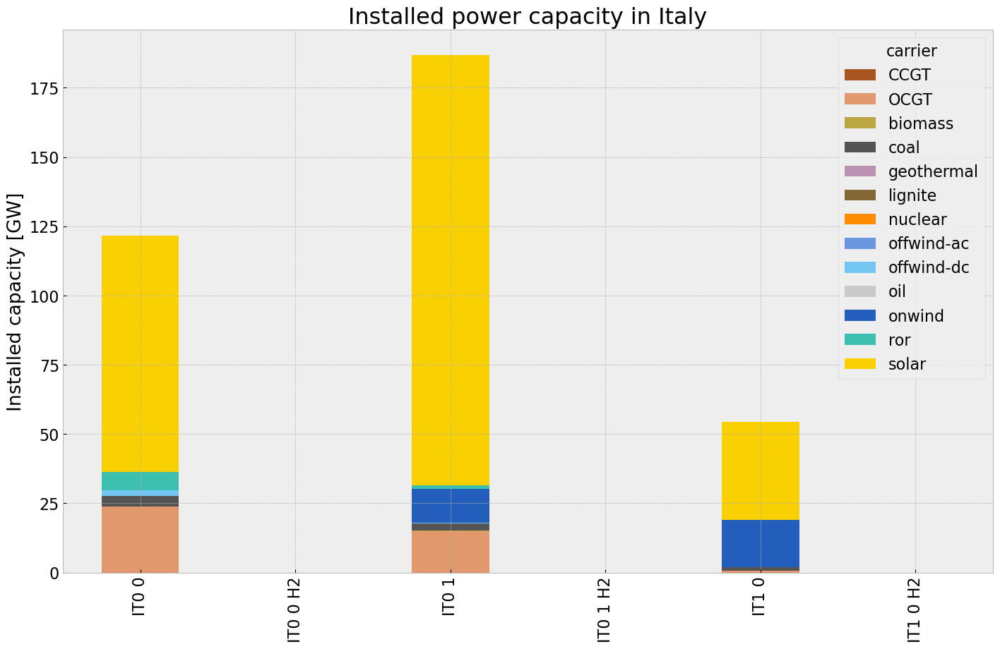

In [406]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

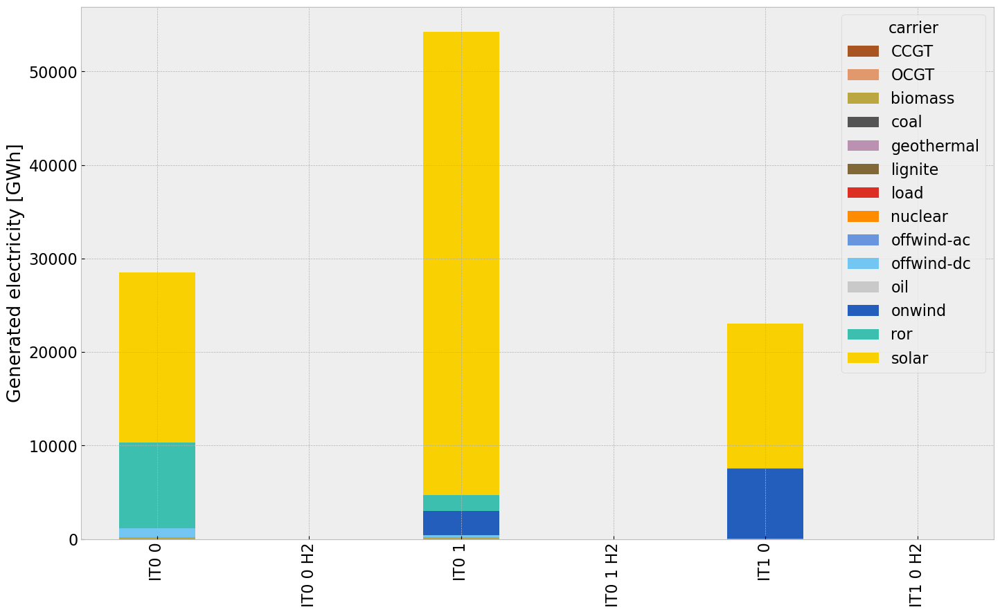

In [407]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


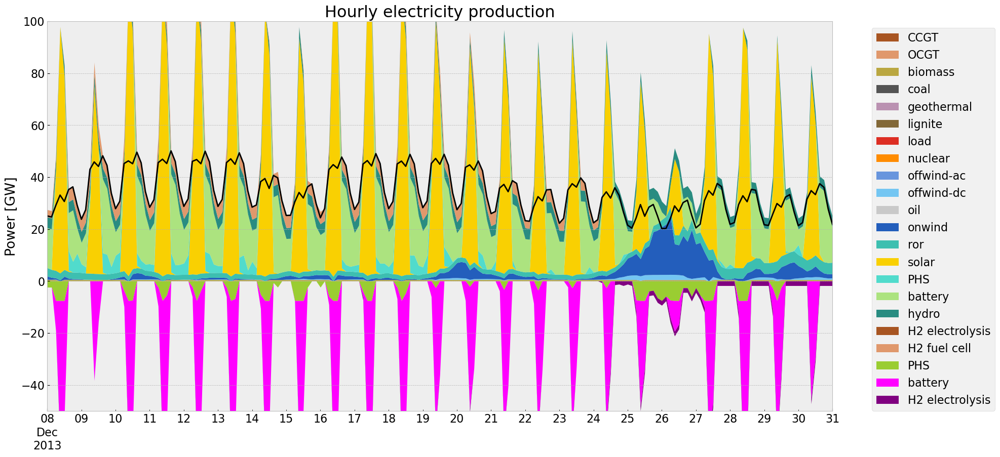

In [408]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


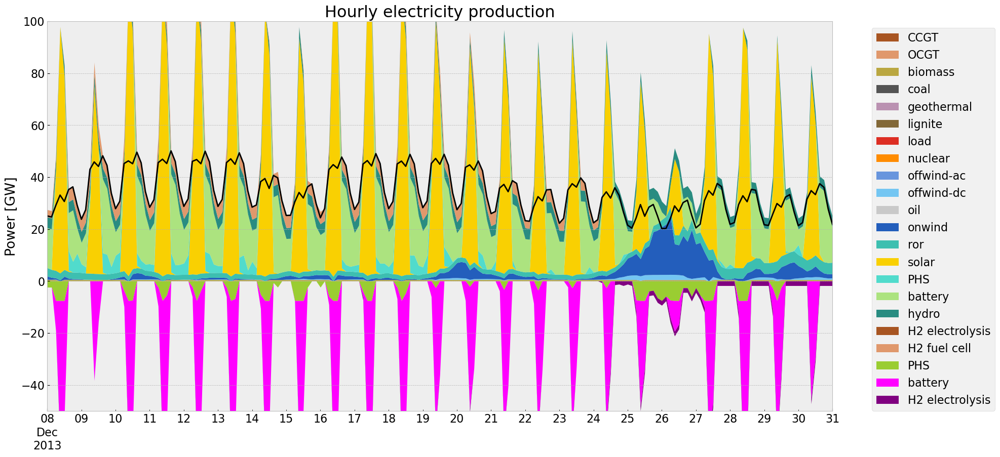

In [409]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,7.231472,3.5108
IT0 1,2.3960,37.396925,0.6060
IT1 0,0.2400,9.733295,0.0780


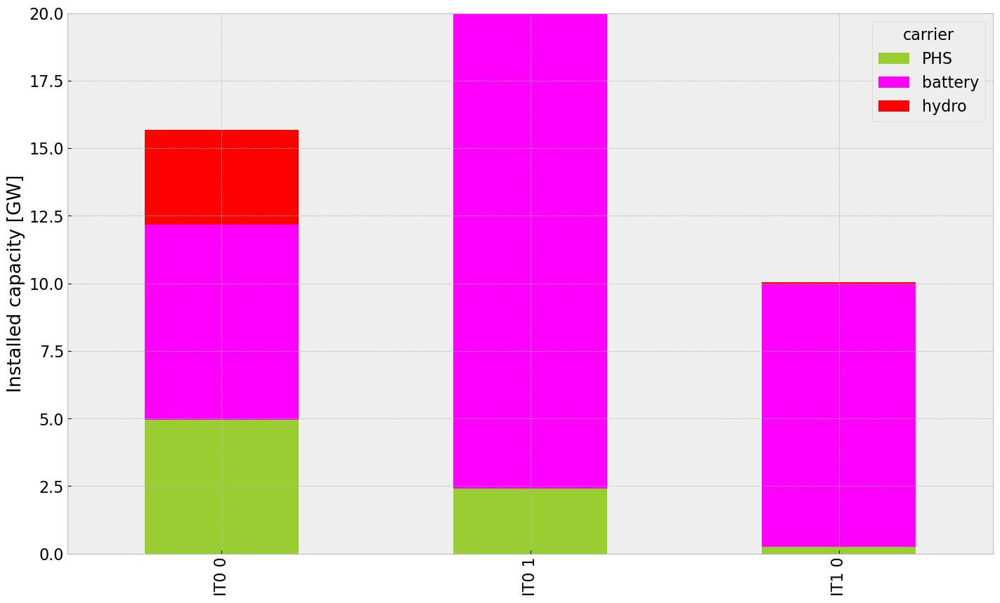

In [410]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


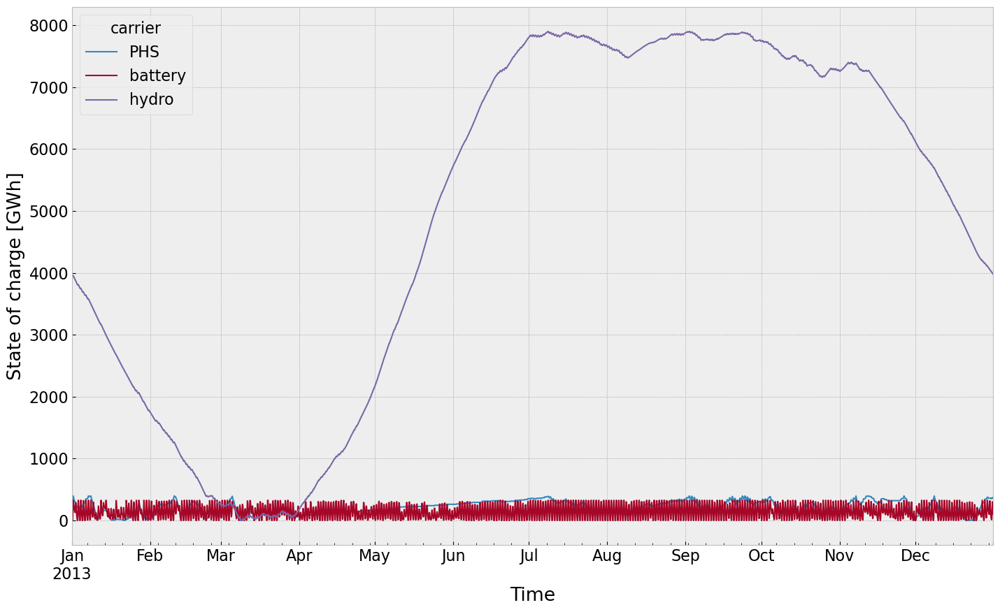

In [411]:
state_of_charge_plot(n1)


## Electricity Price


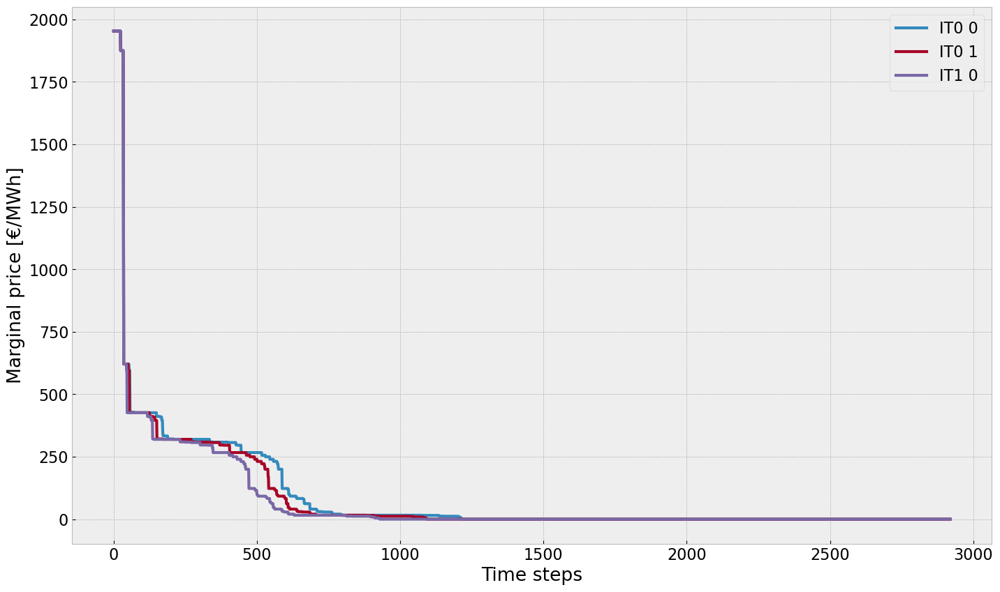

In [412]:
price_dur_curve_plot(n1)



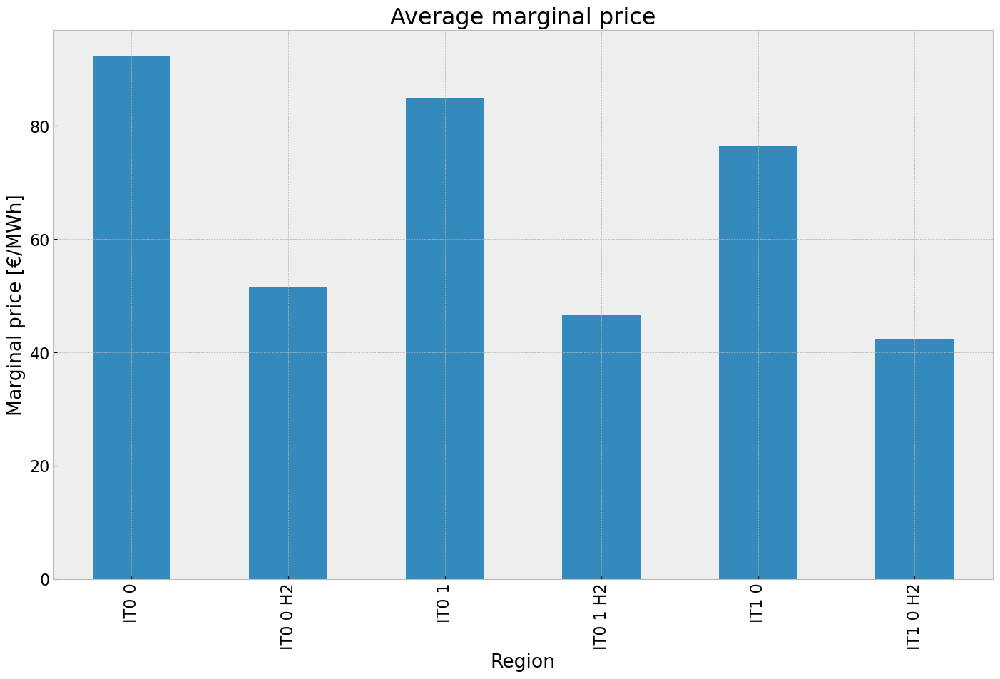

In [413]:
price_regions_table(n1)

## 2. Scenario: perfect foresight with no additional investment

In [414]:
#copy network
n2=n1.copy()

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']

In [415]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,85237.699330,0.0,True,1.0,0.019877,39296.472708,85237.699330,56105.496479,,1.0,1.0,0,0,0,1,0,85471.933442,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,155226.577048,0.0,True,1.0,0.019646,39296.472708,155226.577048,53198.633823,,1.0,1.0,0,0,0,1,0,155226.577048,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,26268.300452,0.0,True,1.0,0.020787,39296.472708,26268.300452,6273.290436,,1.0,1.0,0,0,0,1,0,35468.246759,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


In [416]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [417]:
n2.optimize(solver_name ='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00, 14.21it/s]
INFO:linopy.io: Writing time: 7.18s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9de8u5do.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9de8u5do.lp


Reading time = 2.51 seconds


INFO:gurobipy:Reading time = 2.51 seconds


obj: 531489 rows, 256950 columns, 997225 nonzeros


INFO:gurobipy:obj: 531489 rows, 256950 columns, 997225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 531489 rows, 256950 columns and 997225 nonzeros


INFO:gurobipy:Optimize a model with 531489 rows, 256950 columns and 997225 nonzeros


Model fingerprint: 0xabf13d8d


INFO:gurobipy:Model fingerprint: 0xabf13d8d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 455602 rows and 98949 columns


INFO:gurobipy:Presolve removed 455602 rows and 98949 columns


Presolve time: 1.03s


INFO:gurobipy:Presolve time: 1.03s


Presolved: 75887 rows, 158001 columns, 324398 nonzeros


INFO:gurobipy:Presolved: 75887 rows, 158001 columns, 324398 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 10


INFO:gurobipy: Dense cols : 10


 AA' NZ     : 1.752e+05


INFO:gurobipy: AA' NZ     : 1.752e+05


 Factor NZ  : 1.383e+06 (roughly 100 MB of memory)


INFO:gurobipy: Factor NZ  : 1.383e+06 (roughly 100 MB of memory)


 Factor Ops : 3.733e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.733e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.25993750e+16 -2.50561068e+17  4.48e+06 1.31e+07  7.27e+12     1s


INFO:gurobipy:   0   8.25993750e+16 -2.50561068e+17  4.48e+06 1.31e+07  7.27e+12     1s


   1   5.09268103e+16 -5.45923020e+16  2.26e+06 8.27e+05  2.80e+12     2s


INFO:gurobipy:   1   5.09268103e+16 -5.45923020e+16  2.26e+06 8.27e+05  2.80e+12     2s


   2   4.28221454e+16 -2.59050333e+16  1.80e+06 2.54e+05  2.21e+12     2s


INFO:gurobipy:   2   4.28221454e+16 -2.59050333e+16  1.80e+06 2.54e+05  2.21e+12     2s


   3   7.16059833e+15 -1.03605944e+16  9.76e+04 1.39e+04  1.62e+11     2s


INFO:gurobipy:   3   7.16059833e+15 -1.03605944e+16  9.76e+04 1.39e+04  1.62e+11     2s


   4   7.14215741e+14 -3.64238727e+15  9.10e+03 2.36e+03  2.25e+10     2s


INFO:gurobipy:   4   7.14215741e+14 -3.64238727e+15  9.10e+03 2.36e+03  2.25e+10     2s


   5   3.75060966e+14 -1.57154264e+15  4.49e+03 7.85e+02  9.50e+09     3s


INFO:gurobipy:   5   3.75060966e+14 -1.57154264e+15  4.49e+03 7.85e+02  9.50e+09     3s


   6   2.60820104e+14 -6.60164257e+14  2.97e+03 2.46e+02  4.67e+09     3s


INFO:gurobipy:   6   2.60820104e+14 -6.60164257e+14  2.97e+03 2.46e+02  4.67e+09     3s


   7   1.67581740e+14 -3.98844345e+14  1.84e+03 1.30e+02  2.75e+09     3s


INFO:gurobipy:   7   1.67581740e+14 -3.98844345e+14  1.84e+03 1.30e+02  2.75e+09     3s


   8   9.26451166e+13 -2.55005401e+14  9.99e+02 7.42e+01  1.58e+09     3s


INFO:gurobipy:   8   9.26451166e+13 -2.55005401e+14  9.99e+02 7.42e+01  1.58e+09     3s


   9   5.27568454e+13 -1.80911589e+14  5.76e+02 4.90e+01  9.98e+08     3s


INFO:gurobipy:   9   5.27568454e+13 -1.80911589e+14  5.76e+02 4.90e+01  9.98e+08     3s


  10   2.24079022e+13 -7.19889316e+13  2.45e+02 1.53e+01  3.81e+08     3s


INFO:gurobipy:  10   2.24079022e+13 -7.19889316e+13  2.45e+02 1.53e+01  3.81e+08     3s


  11   3.76255232e+12 -1.82179390e+13  3.81e+01 2.33e+00  7.77e+07     4s


INFO:gurobipy:  11   3.76255232e+12 -1.82179390e+13  3.81e+01 2.33e+00  7.77e+07     4s


  12   2.90517601e+11 -9.45708443e+11  2.46e+00 5.11e-02  4.05e+06     4s


INFO:gurobipy:  12   2.90517601e+11 -9.45708443e+11  2.46e+00 5.11e-02  4.05e+06     4s


  13   2.62352318e+11 -5.67722733e+11  2.20e+00 3.06e-02  2.71e+06     4s


INFO:gurobipy:  13   2.62352318e+11 -5.67722733e+11  2.20e+00 3.06e-02  2.71e+06     4s


  14   1.98692376e+11 -3.01896820e+11  1.59e+00 1.62e-02  1.62e+06     4s


INFO:gurobipy:  14   1.98692376e+11 -3.01896820e+11  1.59e+00 1.62e-02  1.62e+06     4s


  15   1.47395051e+11 -2.54193218e+11  1.10e+00 1.38e-02  1.29e+06     4s


INFO:gurobipy:  15   1.47395051e+11 -2.54193218e+11  1.10e+00 1.38e-02  1.29e+06     4s


  16   1.14063383e+11 -2.01755594e+11  7.79e-01 1.12e-02  1.01e+06     4s


INFO:gurobipy:  16   1.14063383e+11 -2.01755594e+11  7.79e-01 1.12e-02  1.01e+06     4s


  17   8.72303852e+10 -1.18405834e+11  5.41e-01 7.15e-03  6.57e+05     4s


INFO:gurobipy:  17   8.72303852e+10 -1.18405834e+11  5.41e-01 7.15e-03  6.57e+05     4s


  18   6.04199091e+10 -8.38893491e+10  2.92e-01 5.40e-03  4.60e+05     5s


INFO:gurobipy:  18   6.04199091e+10 -8.38893491e+10  2.92e-01 5.40e-03  4.60e+05     5s


  19   4.92734814e+10 -4.14625826e+10  2.05e-01 3.36e-03  2.89e+05     5s


INFO:gurobipy:  19   4.92734814e+10 -4.14625826e+10  2.05e-01 3.36e-03  2.89e+05     5s


  20   4.45836524e+10 -1.90772572e+10  1.67e-01 2.23e-03  2.02e+05     5s


INFO:gurobipy:  20   4.45836524e+10 -1.90772572e+10  1.67e-01 2.23e-03  2.02e+05     5s


  21   4.02776818e+10 -1.18991632e+10  1.32e-01 1.84e-03  1.66e+05     5s


INFO:gurobipy:  21   4.02776818e+10 -1.18991632e+10  1.32e-01 1.84e-03  1.66e+05     5s


  22   3.68900455e+10 -2.58917070e+08  1.08e-01 1.24e-03  1.18e+05     5s


INFO:gurobipy:  22   3.68900455e+10 -2.58917070e+08  1.08e-01 1.24e-03  1.18e+05     5s


  23   3.28389844e+10  4.13094344e+09  7.79e-02 1.01e-03  9.11e+04     6s


INFO:gurobipy:  23   3.28389844e+10  4.13094344e+09  7.79e-02 1.01e-03  9.11e+04     6s


  24   3.02849150e+10  1.03966329e+10  5.81e-02 6.76e-04  6.31e+04     6s


INFO:gurobipy:  24   3.02849150e+10  1.03966329e+10  5.81e-02 6.76e-04  6.31e+04     6s


  25   2.87408833e+10  1.45958079e+10  4.64e-02 4.52e-04  4.49e+04     6s


INFO:gurobipy:  25   2.87408833e+10  1.45958079e+10  4.64e-02 4.52e-04  4.49e+04     6s


  26   2.73197859e+10  1.75305940e+10  3.52e-02 2.94e-04  3.10e+04     6s


INFO:gurobipy:  26   2.73197859e+10  1.75305940e+10  3.52e-02 2.94e-04  3.10e+04     6s


  27   2.63774275e+10  1.91259932e+10  2.79e-02 2.07e-04  2.30e+04     7s


INFO:gurobipy:  27   2.63774275e+10  1.91259932e+10  2.79e-02 2.07e-04  2.30e+04     7s


  28   2.55058748e+10  2.00206296e+10  2.08e-02 1.58e-04  1.74e+04     7s


INFO:gurobipy:  28   2.55058748e+10  2.00206296e+10  2.08e-02 1.58e-04  1.74e+04     7s


  29   2.47636177e+10  2.06680979e+10  1.48e-02 1.23e-04  1.30e+04     7s


INFO:gurobipy:  29   2.47636177e+10  2.06680979e+10  1.48e-02 1.23e-04  1.30e+04     7s


  30   2.43455395e+10  2.15904514e+10  1.13e-02 7.54e-05  8.73e+03     7s


INFO:gurobipy:  30   2.43455395e+10  2.15904514e+10  1.13e-02 7.54e-05  8.73e+03     7s


  31   2.39490866e+10  2.19685090e+10  8.06e-03 5.48e-05  6.27e+03     7s


INFO:gurobipy:  31   2.39490866e+10  2.19685090e+10  8.06e-03 5.48e-05  6.27e+03     7s


  32   2.37570996e+10  2.23961380e+10  6.55e-03 3.22e-05  4.31e+03     8s


INFO:gurobipy:  32   2.37570996e+10  2.23961380e+10  6.55e-03 3.22e-05  4.31e+03     8s


  33   2.35367400e+10  2.26027762e+10  4.75e-03 2.05e-05  2.96e+03     8s


INFO:gurobipy:  33   2.35367400e+10  2.26027762e+10  4.75e-03 2.05e-05  2.96e+03     8s


  34   2.34123540e+10  2.26826935e+10  3.77e-03 1.60e-05  2.31e+03     8s


INFO:gurobipy:  34   2.34123540e+10  2.26826935e+10  3.77e-03 1.60e-05  2.31e+03     8s


  35   2.33018998e+10  2.27552487e+10  2.79e-03 1.21e-05  1.73e+03     8s


INFO:gurobipy:  35   2.33018998e+10  2.27552487e+10  2.79e-03 1.21e-05  1.73e+03     8s


  36   2.32441957e+10  2.27961400e+10  2.29e-03 9.99e-06  1.42e+03     9s


INFO:gurobipy:  36   2.32441957e+10  2.27961400e+10  2.29e-03 9.99e-06  1.42e+03     9s


  37   2.32046531e+10  2.28230815e+10  1.89e-03 8.68e-06  1.21e+03     9s


INFO:gurobipy:  37   2.32046531e+10  2.28230815e+10  1.89e-03 8.68e-06  1.21e+03     9s


  38   2.31655162e+10  2.28542634e+10  1.59e-03 7.13e-06  9.86e+02     9s


INFO:gurobipy:  38   2.31655162e+10  2.28542634e+10  1.59e-03 7.13e-06  9.86e+02     9s


  39   2.31446039e+10  2.29013223e+10  1.41e-03 4.77e-06  7.70e+02    10s


INFO:gurobipy:  39   2.31446039e+10  2.29013223e+10  1.41e-03 4.77e-06  7.70e+02    10s


  40   2.31176188e+10  2.29179957e+10  1.17e-03 3.90e-06  6.32e+02    10s


INFO:gurobipy:  40   2.31176188e+10  2.29179957e+10  1.17e-03 3.90e-06  6.32e+02    10s


  41   2.30856103e+10  2.29395799e+10  8.67e-04 2.79e-06  4.62e+02    10s


INFO:gurobipy:  41   2.30856103e+10  2.29395799e+10  8.67e-04 2.79e-06  4.62e+02    10s


  42   2.30694000e+10  2.29585358e+10  7.06e-04 1.87e-06  3.51e+02    10s


INFO:gurobipy:  42   2.30694000e+10  2.29585358e+10  7.06e-04 1.87e-06  3.51e+02    10s


  43   2.30549908e+10  2.29679100e+10  5.73e-04 1.40e-06  2.76e+02    11s


INFO:gurobipy:  43   2.30549908e+10  2.29679100e+10  5.73e-04 1.40e-06  2.76e+02    11s


  44   2.30483168e+10  2.29725313e+10  5.09e-04 1.17e-06  2.40e+02    11s


INFO:gurobipy:  44   2.30483168e+10  2.29725313e+10  5.09e-04 1.17e-06  2.40e+02    11s


  45   2.30257557e+10  2.29794569e+10  2.93e-04 8.32e-07  1.47e+02    11s


INFO:gurobipy:  45   2.30257557e+10  2.29794569e+10  2.93e-04 8.32e-07  1.47e+02    11s


  46   2.30201795e+10  2.29840652e+10  2.37e-04 6.18e-07  1.14e+02    12s


INFO:gurobipy:  46   2.30201795e+10  2.29840652e+10  2.37e-04 6.18e-07  1.14e+02    12s


  47   2.30043650e+10  2.29890688e+10  8.00e-05 3.91e-07  4.84e+01    12s


INFO:gurobipy:  47   2.30043650e+10  2.29890688e+10  8.00e-05 3.91e-07  4.84e+01    12s


  48   2.30038111e+10  2.29900227e+10  7.31e-05 3.51e-07  4.37e+01    12s


INFO:gurobipy:  48   2.30038111e+10  2.29900227e+10  7.31e-05 3.51e-07  4.37e+01    12s


  49   2.30016651e+10  2.29921983e+10  4.39e-05 2.54e-07  3.00e+01    12s


INFO:gurobipy:  49   2.30016651e+10  2.29921983e+10  4.39e-05 2.54e-07  3.00e+01    12s


  50   2.29998875e+10  2.29953282e+10  2.07e-05 1.14e-07  1.44e+01    13s


INFO:gurobipy:  50   2.29998875e+10  2.29953282e+10  2.07e-05 1.14e-07  1.44e+01    13s


  51   2.29994506e+10  2.29965448e+10  1.51e-05 6.50e-08  9.20e+00    13s


INFO:gurobipy:  51   2.29994506e+10  2.29965448e+10  1.51e-05 6.50e-08  9.20e+00    13s


  52   2.29993972e+10  2.29969692e+10  1.42e-05 4.91e-08  7.69e+00    13s


INFO:gurobipy:  52   2.29993972e+10  2.29969692e+10  1.42e-05 4.91e-08  7.69e+00    13s


  53   2.29989967e+10  2.29971884e+10  9.23e-06 4.01e-08  5.73e+00    13s


INFO:gurobipy:  53   2.29989967e+10  2.29971884e+10  9.23e-06 4.01e-08  5.73e+00    13s


  54   2.29988214e+10  2.29973942e+10  7.12e-06 3.16e-08  4.52e+00    13s


INFO:gurobipy:  54   2.29988214e+10  2.29973942e+10  7.12e-06 3.16e-08  4.52e+00    13s


  55   2.29987846e+10  2.29975189e+10  6.68e-06 2.69e-08  4.01e+00    14s


INFO:gurobipy:  55   2.29987846e+10  2.29975189e+10  6.68e-06 2.69e-08  4.01e+00    14s


  56   2.29987595e+10  2.29975447e+10  6.39e-06 2.58e-08  3.85e+00    14s


INFO:gurobipy:  56   2.29987595e+10  2.29975447e+10  6.39e-06 2.58e-08  3.85e+00    14s


  57   2.29986519e+10  2.29976951e+10  5.13e-06 1.95e-08  3.03e+00    14s


INFO:gurobipy:  57   2.29986519e+10  2.29976951e+10  5.13e-06 1.95e-08  3.03e+00    14s


  58   2.29985579e+10  2.29978627e+10  4.05e-06 1.26e-08  2.20e+00    14s


INFO:gurobipy:  58   2.29985579e+10  2.29978627e+10  4.05e-06 1.26e-08  2.20e+00    14s


  59   2.29984459e+10  2.29979086e+10  2.80e-06 1.07e-08  1.70e+00    14s


INFO:gurobipy:  59   2.29984459e+10  2.29979086e+10  2.80e-06 1.07e-08  1.70e+00    14s


  60   2.29984116e+10  2.29980096e+10  2.43e-06 6.53e-09  1.27e+00    15s


INFO:gurobipy:  60   2.29984116e+10  2.29980096e+10  2.43e-06 6.53e-09  1.27e+00    15s


  61   2.29983602e+10  2.29980676e+10  1.90e-06 4.13e-09  9.26e-01    15s


INFO:gurobipy:  61   2.29983602e+10  2.29980676e+10  1.90e-06 4.13e-09  9.26e-01    15s


  62   2.29982971e+10  2.29980913e+10  1.22e-06 4.04e-09  6.52e-01    16s


INFO:gurobipy:  62   2.29982971e+10  2.29980913e+10  1.22e-06 4.04e-09  6.52e-01    16s


  63   2.29982408e+10  2.29981303e+10  6.49e-07 3.74e-09  3.50e-01    17s


INFO:gurobipy:  63   2.29982408e+10  2.29981303e+10  6.49e-07 3.74e-09  3.50e-01    17s


  64   2.29982213e+10  2.29981458e+10  4.60e-07 4.46e-09  2.39e-01    18s


INFO:gurobipy:  64   2.29982213e+10  2.29981458e+10  4.60e-07 4.46e-09  2.39e-01    18s


  65   2.29982182e+10  2.29981506e+10  4.30e-07 3.93e-09  2.14e-01    18s


INFO:gurobipy:  65   2.29982182e+10  2.29981506e+10  4.30e-07 3.93e-09  2.14e-01    18s


  66   2.29982107e+10  2.29981565e+10  3.55e-07 3.62e-09  1.72e-01    18s


INFO:gurobipy:  66   2.29982107e+10  2.29981565e+10  3.55e-07 3.62e-09  1.72e-01    18s


  67   2.29981993e+10  2.29981630e+10  2.43e-07 3.73e-09  1.15e-01    18s


INFO:gurobipy:  67   2.29981993e+10  2.29981630e+10  2.43e-07 3.73e-09  1.15e-01    18s


  68   2.29981925e+10  2.29981647e+10  1.80e-07 3.63e-09  8.82e-02    19s


INFO:gurobipy:  68   2.29981925e+10  2.29981647e+10  1.80e-07 3.63e-09  8.82e-02    19s


  69   2.29981832e+10  2.29981701e+10  8.92e-08 4.00e-09  4.15e-02    19s


INFO:gurobipy:  69   2.29981832e+10  2.29981701e+10  8.92e-08 4.00e-09  4.15e-02    19s


  70   2.29981781e+10  2.29981724e+10  7.59e-08 4.49e-09  1.80e-02    20s


INFO:gurobipy:  70   2.29981781e+10  2.29981724e+10  7.59e-08 4.49e-09  1.80e-02    20s


  71   2.29981757e+10  2.29981733e+10  1.48e-05 5.25e-09  7.58e-03    20s


INFO:gurobipy:  71   2.29981757e+10  2.29981733e+10  1.48e-05 5.25e-09  7.58e-03    20s


  72   2.29981749e+10  2.29981737e+10  2.88e-05 4.44e-09  3.91e-03    20s


INFO:gurobipy:  72   2.29981749e+10  2.29981737e+10  2.88e-05 4.44e-09  3.91e-03    20s


  73   2.29981745e+10  2.29981738e+10  1.70e-05 4.02e-09  2.24e-03    20s


INFO:gurobipy:  73   2.29981745e+10  2.29981738e+10  1.70e-05 4.02e-09  2.24e-03    20s


  74   2.29981741e+10  2.29981739e+10  7.63e-04 4.48e-09  7.56e-04    20s


INFO:gurobipy:  74   2.29981741e+10  2.29981739e+10  7.63e-04 4.48e-09  7.56e-04    20s


  75   2.29981739e+10  2.29981739e+10  4.94e-05 3.95e-09  8.01e-05    21s


INFO:gurobipy:  75   2.29981739e+10  2.29981739e+10  4.94e-05 3.95e-09  8.01e-05    21s


  76   2.29981739e+10  2.29981739e+10  8.71e-05 5.59e-09  1.57e-05    21s


INFO:gurobipy:  76   2.29981739e+10  2.29981739e+10  8.71e-05 5.59e-09  1.57e-05    21s


  77   2.29981739e+10  2.29981739e+10  3.39e-04 2.12e-08  7.41e-07    21s


INFO:gurobipy:  77   2.29981739e+10  2.29981739e+10  3.39e-04 2.12e-08  7.41e-07    21s


  78   2.29981739e+10  2.29981739e+10  7.07e-04 2.58e-08  3.28e-07    21s


INFO:gurobipy:  78   2.29981739e+10  2.29981739e+10  7.07e-04 2.58e-08  3.28e-07    21s


  79   2.29981739e+10  2.29981739e+10  7.12e-04 2.02e-08  4.07e-11    21s


INFO:gurobipy:  79   2.29981739e+10  2.29981739e+10  7.12e-04 2.02e-08  4.07e-11    21s


INFO:gurobipy:


Barrier solved model in 79 iterations and 21.17 seconds (5.63 work units)


INFO:gurobipy:Barrier solved model in 79 iterations and 21.17 seconds (5.63 work units)


Optimal objective 2.29981739e+10


INFO:gurobipy:Optimal objective 2.29981739e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


     972 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:     972 DPushes remaining with DInf 0.0000000e+00                21s


       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:


   10266 PPushes remaining with PInf 9.9788899e-04                21s


INFO:gurobipy:   10266 PPushes remaining with PInf 9.9788899e-04                21s


       0 PPushes remaining with PInf 9.9788899e-04                23s


INFO:gurobipy:       0 PPushes remaining with PInf 9.9788899e-04                23s


INFO:gurobipy:


  Push phase complete: Pinf 9.9788899e-04, Dinf 1.2954944e-08     23s


INFO:gurobipy:  Push phase complete: Pinf 9.9788899e-04, Dinf 1.2954944e-08     23s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   11241    2.2998174e+10   9.978890e-04   0.000000e+00     23s


INFO:gurobipy:   11241    2.2998174e+10   9.978890e-04   0.000000e+00     23s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   11242    2.2998174e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:   11242    2.2998174e+10   0.000000e+00   0.000000e+00     23s


INFO:gurobipy:


Solved in 11242 iterations and 23.44 seconds (7.11 work units)


INFO:gurobipy:Solved in 11242 iterations and 23.44 seconds (7.11 work units)


Optimal objective  2.299817394e+10


INFO:gurobipy:Optimal objective  2.299817394e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 256950 primals, 531489 duals
Objective: 2.30e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [418]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

In [419]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,85237.699330,0.0,True,1.0,0.019877,39296.472708,85237.699330,56105.496479,,1.0,1.0,0,0,0,1,0,85237.699329,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,155226.577048,0.0,True,1.0,0.019646,39296.472708,155226.577048,53198.633823,,1.0,1.0,0,0,0,1,0,155226.577048,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,26268.300452,0.0,True,1.0,0.020787,39296.472708,26268.300452,6273.290436,,1.0,1.0,0,0,0,1,0,26268.300452,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


<Figure size 640x480 with 0 Axes>

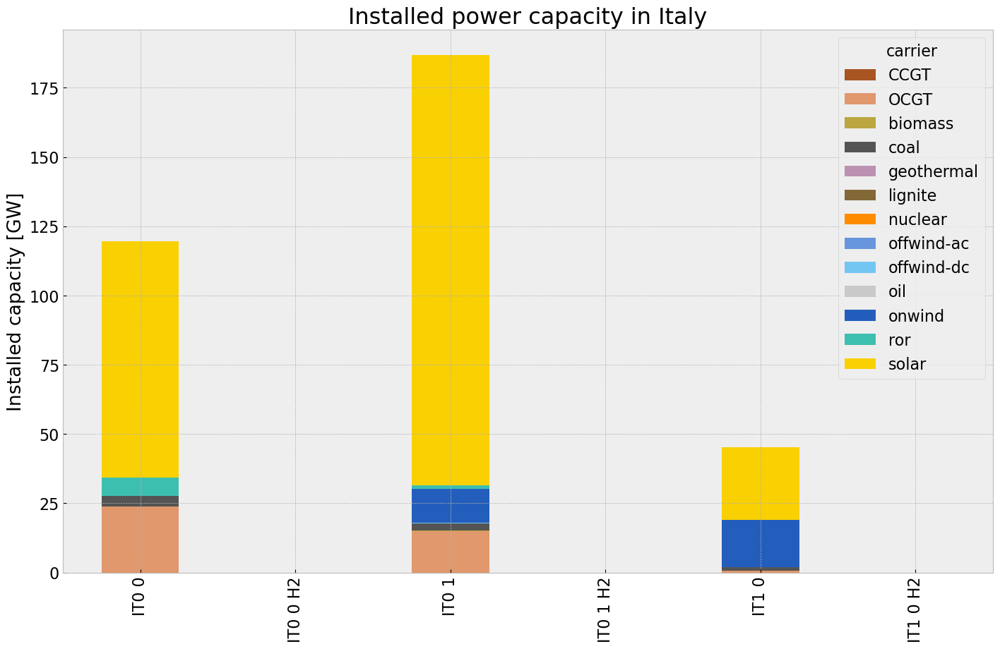

In [420]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

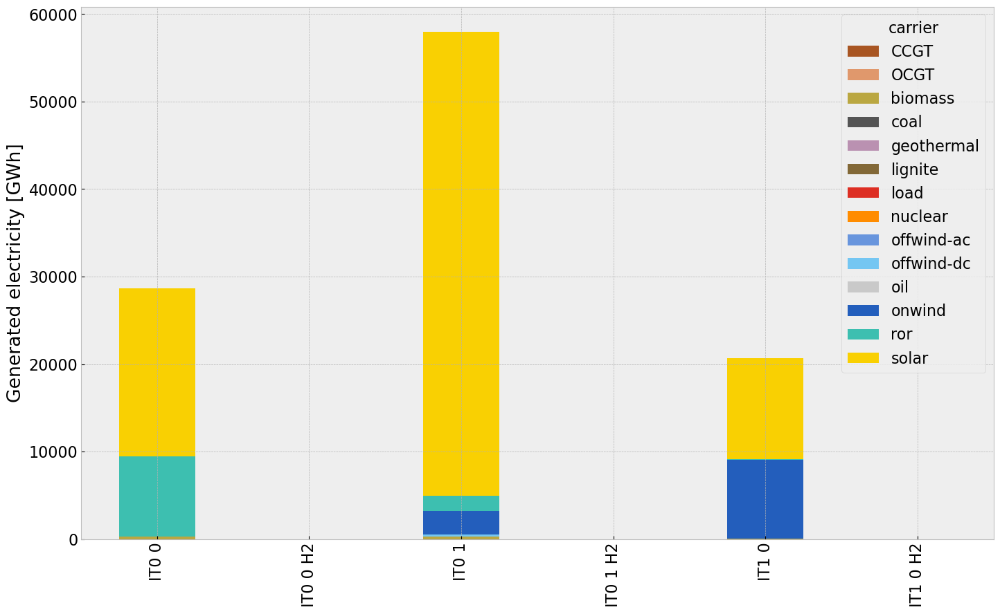

In [421]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3164538613.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3164538613.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axi

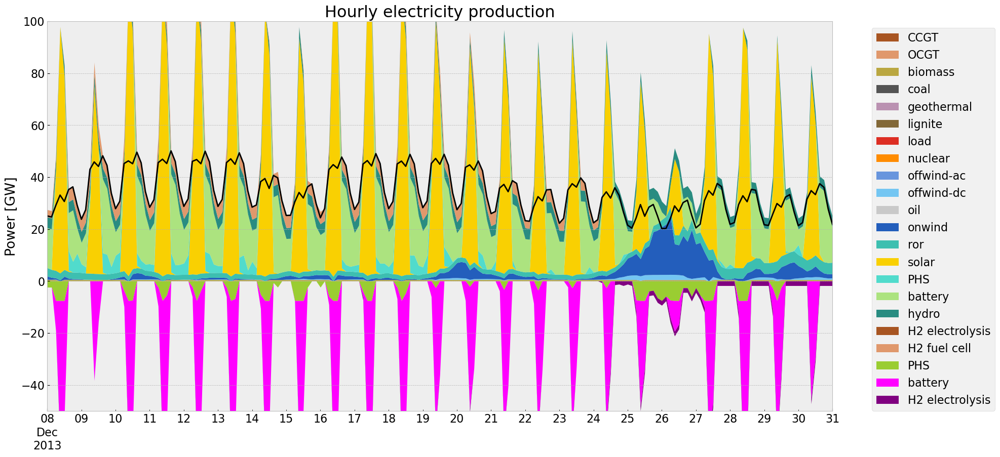

In [422]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:15: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:22: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


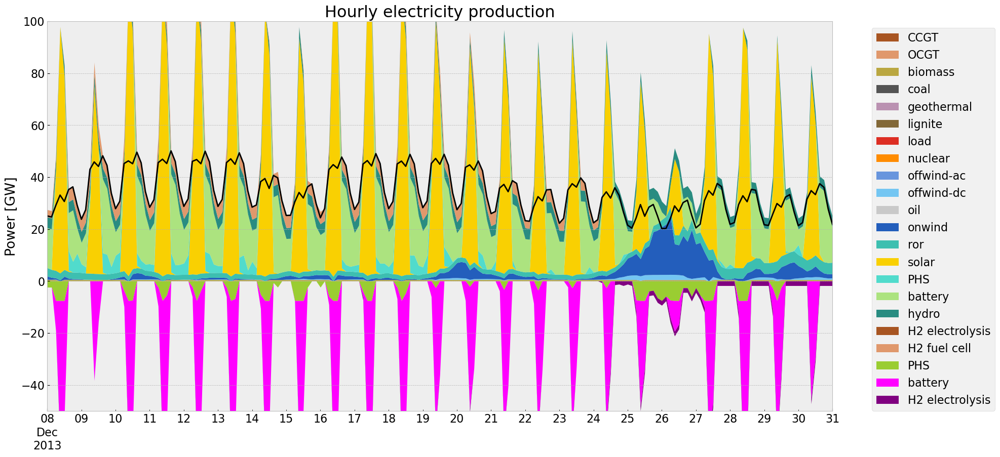

In [423]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)



C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3374477851.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3374477851.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


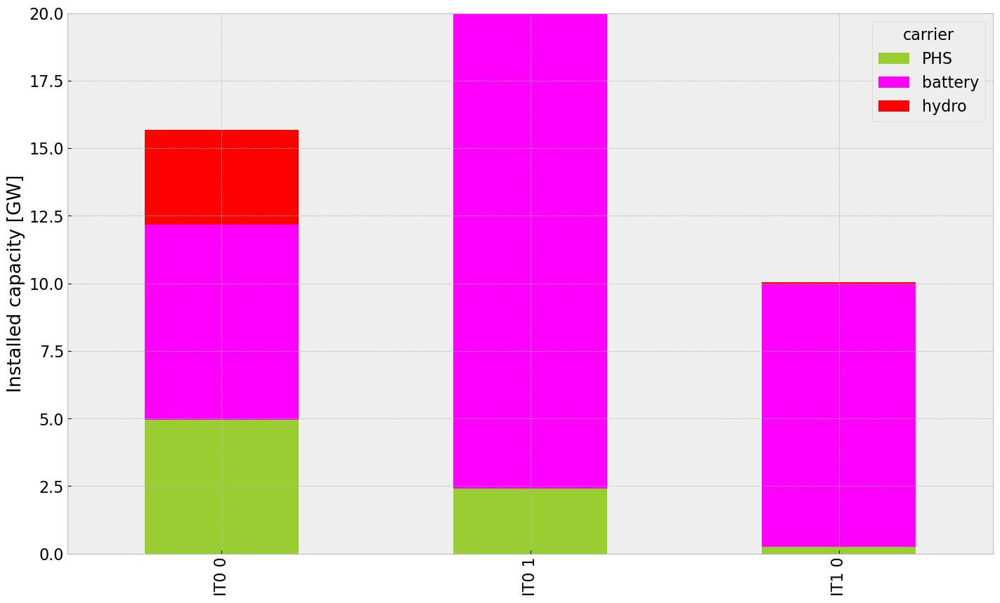

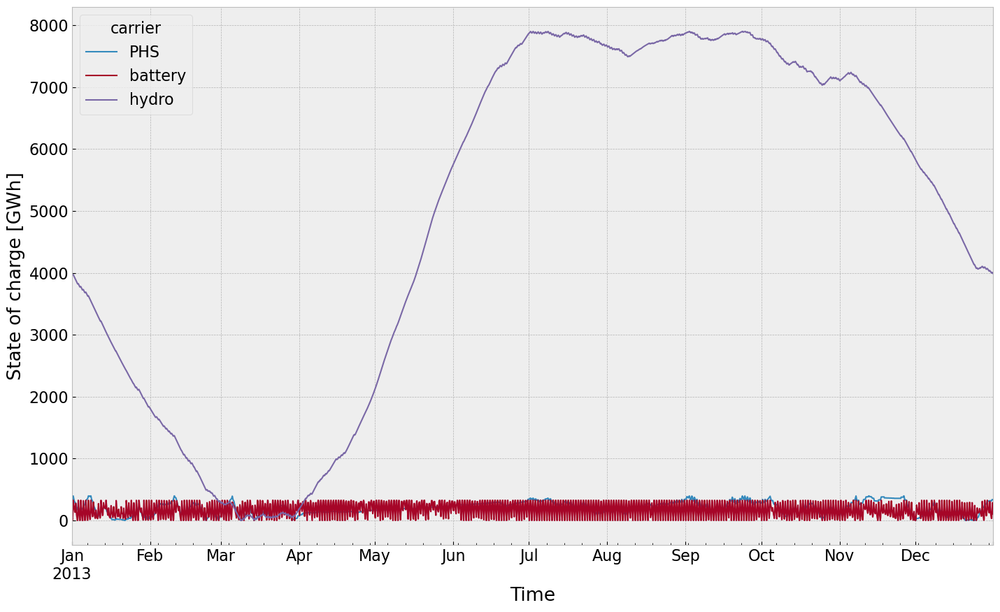

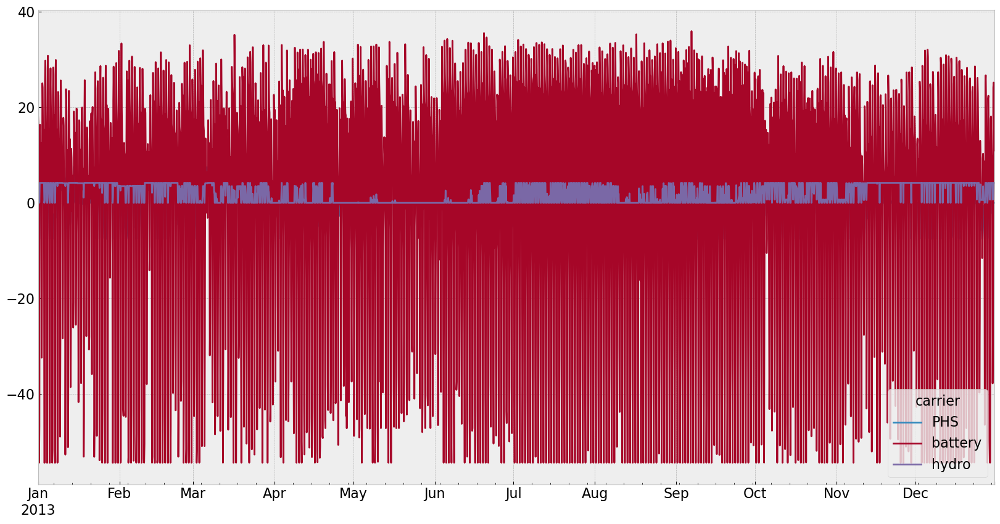

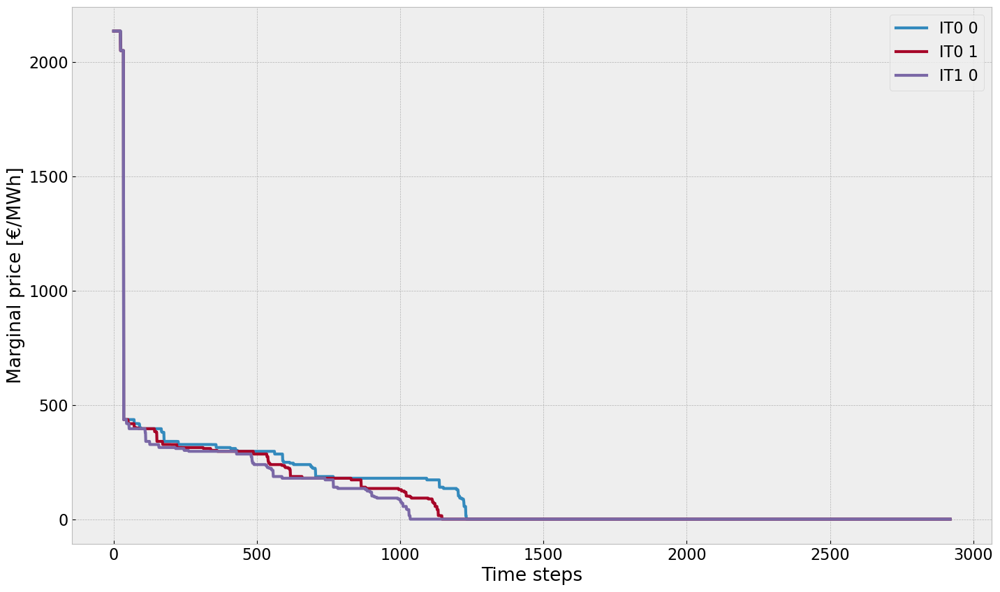

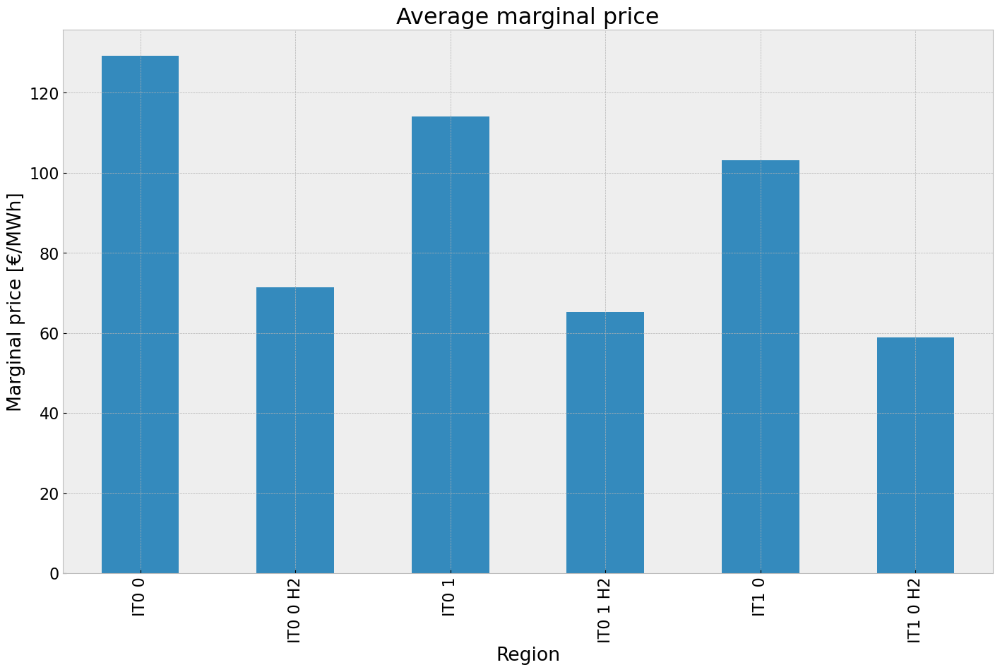

In [424]:
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
price_dur_curve_plot(n2)
price_regions_table(n2)


## 3. Scenario: rolling horizon foresight with no additional investment

In [425]:
n3= n2.copy()
n3.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [426]:
optimize.optimize_with_rolling_horizon(n3, horizon=24, overlap=0,
                                       solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nonq0x69.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nonq0x69.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8236 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8236 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8236 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8236 nonzeros


Model fingerprint: 0x788e5903


INFO:gurobipy:Model fingerprint: 0x788e5903


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 837 columns


INFO:gurobipy:Presolve removed 3793 rows and 837 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     821    2.7126473e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     821    2.7126473e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 821 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 821 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.712647301e+11


INFO:gurobipy:Optimal objective  2.712647301e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.71e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z4c3r5qp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z4c3r5qp.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0x778a3aa7


INFO:gurobipy:Model fingerprint: 0x778a3aa7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     658    1.9240725e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     658    1.9240725e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 658 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 658 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.924072451e+10


INFO:gurobipy:Optimal objective  1.924072451e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-brx8h8xi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-brx8h8xi.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x14b9b78f


INFO:gurobipy:Model fingerprint: 0x14b9b78f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 838 columns


INFO:gurobipy:Presolve removed 3793 rows and 838 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1303 columns, 2661 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1303 columns, 2661 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     856    5.9601660e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     856    5.9601660e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 856 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 856 iterations and 0.08 seconds (0.02 work units)


Optimal objective  5.960166047e+11


INFO:gurobipy:Optimal objective  5.960166047e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.96e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nnmsrt94.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nnmsrt94.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8248 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8248 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8248 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8248 nonzeros


Model fingerprint: 0xea0318df


INFO:gurobipy:Model fingerprint: 0xea0318df


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     793    3.7714607e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     793    3.7714607e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 793 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 793 iterations and 0.07 seconds (0.01 work units)


Optimal objective  3.771460683e+11


INFO:gurobipy:Optimal objective  3.771460683e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.77e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70yqdvnl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70yqdvnl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x93995225


INFO:gurobipy:Model fingerprint: 0x93995225


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     756    7.5700020e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     756    7.5700020e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 756 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 756 iterations and 0.07 seconds (0.01 work units)


Optimal objective  7.570001971e+11


INFO:gurobipy:Optimal objective  7.570001971e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 7.57e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aecx9z3h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aecx9z3h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0x98c50882


INFO:gurobipy:Model fingerprint: 0x98c50882


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     786    4.1249111e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     786    4.1249111e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 786 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 786 iterations and 0.06 seconds (0.02 work units)


Optimal objective  4.124911115e+11


INFO:gurobipy:Optimal objective  4.124911115e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.12e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-afon4aum.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-afon4aum.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0x6d61a147


INFO:gurobipy:Model fingerprint: 0x6d61a147


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     724    6.3506004e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     724    6.3506004e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 724 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 724 iterations and 0.07 seconds (0.01 work units)


Optimal objective  6.350600418e+11


INFO:gurobipy:Optimal objective  6.350600418e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 6.35e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-epdjw6me.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-epdjw6me.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0xe029a657


INFO:gurobipy:Model fingerprint: 0xe029a657


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     653    2.1638381e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     653    2.1638381e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 653 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 653 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.163838054e+11


INFO:gurobipy:Optimal objective  2.163838054e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.16e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-itdbtxdg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-itdbtxdg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x200a02c2


INFO:gurobipy:Model fingerprint: 0x200a02c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     750    1.9364755e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     750    1.9364755e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 750 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 750 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.936475498e+10


INFO:gurobipy:Optimal objective  1.936475498e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j3c08st5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j3c08st5.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8251 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8251 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


Model fingerprint: 0xaac6aeb1


INFO:gurobipy:Model fingerprint: 0xaac6aeb1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     775    4.8384842e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     775    4.8384842e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 775 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 775 iterations and 0.08 seconds (0.02 work units)


Optimal objective  4.838484159e+11


INFO:gurobipy:Optimal objective  4.838484159e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.84e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-elu5sk4c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-elu5sk4c.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x80194211


INFO:gurobipy:Model fingerprint: 0x80194211


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     675    2.2720195e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     675    2.2720195e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 675 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 675 iterations and 0.09 seconds (0.01 work units)


Optimal objective  2.272019484e+11


INFO:gurobipy:Optimal objective  2.272019484e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.27e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-588uls08.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-588uls08.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x696c1be0


INFO:gurobipy:Model fingerprint: 0x696c1be0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     745    2.0367964e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     745    2.0367964e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 745 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 745 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.036796366e+10


INFO:gurobipy:Optimal objective  2.036796366e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.04e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4xb1_1l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4xb1_1l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0xda9c871b


INFO:gurobipy:Model fingerprint: 0xda9c871b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     795    5.3144950e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     795    5.3144950e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 795 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 795 iterations and 0.08 seconds (0.02 work units)


Optimal objective  5.314494975e+10


INFO:gurobipy:Optimal objective  5.314494975e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.31e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fho8wr7z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fho8wr7z.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xcbf5cf5b


INFO:gurobipy:Model fingerprint: 0xcbf5cf5b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     825    5.1502831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     825    5.1502831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 825 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 825 iterations and 0.07 seconds (0.02 work units)


Optimal objective  5.150283078e+10


INFO:gurobipy:Optimal objective  5.150283078e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.15e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-00fhef0d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-00fhef0d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0xbad17959


INFO:gurobipy:Model fingerprint: 0xbad17959


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     835    5.1738411e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     835    5.1738411e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 835 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 835 iterations and 0.07 seconds (0.02 work units)


Optimal objective  5.173841147e+11


INFO:gurobipy:Optimal objective  5.173841147e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.17e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ad5vhwv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ad5vhwv.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8239 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8239 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


Model fingerprint: 0xf5b268dd


INFO:gurobipy:Model fingerprint: 0xf5b268dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 839 columns


INFO:gurobipy:Presolve removed 3793 rows and 839 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     655    1.9428566e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     655    1.9428566e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 655 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 655 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.942856553e+10


INFO:gurobipy:Optimal objective  1.942856553e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4rd3ub6_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4rd3ub6_.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8251 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8251 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


Model fingerprint: 0xe6000041


INFO:gurobipy:Model fingerprint: 0xe6000041


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     848    3.0029454e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     848    3.0029454e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 848 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 848 iterations and 0.08 seconds (0.02 work units)


Optimal objective  3.002945370e+11


INFO:gurobipy:Optimal objective  3.002945370e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.00e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2cr0fh49.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2cr0fh49.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0xc5180b83


INFO:gurobipy:Model fingerprint: 0xc5180b83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     814    4.4206923e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     814    4.4206923e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 814 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 814 iterations and 0.07 seconds (0.02 work units)


Optimal objective  4.420692350e+11


INFO:gurobipy:Optimal objective  4.420692350e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.42e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-el2o3wk1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-el2o3wk1.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0x55fcebb7


INFO:gurobipy:Model fingerprint: 0x55fcebb7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     814    2.4671848e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     814    2.4671848e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 814 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 814 iterations and 0.08 seconds (0.02 work units)


Optimal objective  2.467184822e+10


INFO:gurobipy:Optimal objective  2.467184822e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.47e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c4e1z2he.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c4e1z2he.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 4417 rows, 2141 columns, 8253 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8253 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8253 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8253 nonzeros


Model fingerprint: 0xf9cafebf


INFO:gurobipy:Model fingerprint: 0xf9cafebf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     706    4.1938643e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     706    4.1938643e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 706 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 706 iterations and 0.06 seconds (0.01 work units)


Optimal objective  4.193864310e+10


INFO:gurobipy:Optimal objective  4.193864310e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.19e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9780dytq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9780dytq.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8240 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8240 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


Model fingerprint: 0x241ca585


INFO:gurobipy:Model fingerprint: 0x241ca585


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     658    1.9167799e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     658    1.9167799e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 658 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 658 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.916779933e+10


INFO:gurobipy:Optimal objective  1.916779933e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2f_cau61.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2f_cau61.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0x5651641e


INFO:gurobipy:Model fingerprint: 0x5651641e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     864    5.4925665e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     864    5.4925665e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 864 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 864 iterations and 0.06 seconds (0.02 work units)


Optimal objective  5.492566464e+11


INFO:gurobipy:Optimal objective  5.492566464e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.49e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_t4oa__y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_t4oa__y.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0xea29659c


INFO:gurobipy:Model fingerprint: 0xea29659c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     640    1.9312837e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     640    1.9312837e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 640 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 640 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.931283676e+10


INFO:gurobipy:Optimal objective  1.931283676e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_hpmgbf2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_hpmgbf2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8249 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8249 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


Model fingerprint: 0x29f8121e


INFO:gurobipy:Model fingerprint: 0x29f8121e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     654    1.9397271e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     654    1.9397271e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 654 iterations and 0.11 seconds (0.01 work units)


INFO:gurobipy:Solved in 654 iterations and 0.11 seconds (0.01 work units)


Optimal objective  1.939727123e+10


INFO:gurobipy:Optimal objective  1.939727123e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-stqgw1ul.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-stqgw1ul.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0xcb4be6b9


INFO:gurobipy:Model fingerprint: 0xcb4be6b9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     562    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     562    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 562 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 562 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.914943477e+10


INFO:gurobipy:Optimal objective  1.914943477e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3fgi8wxb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3fgi8wxb.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x6b16c1f4


INFO:gurobipy:Model fingerprint: 0x6b16c1f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     653    1.9207968e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     653    1.9207968e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 653 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 653 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.920796763e+10


INFO:gurobipy:Optimal objective  1.920796763e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-va9z3_fs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-va9z3_fs.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0xea6ef106


INFO:gurobipy:Model fingerprint: 0xea6ef106


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     578    1.9149652e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     578    1.9149652e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 578 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 578 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914965235e+10


INFO:gurobipy:Optimal objective  1.914965235e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x_758dj9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x_758dj9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0x8fd23e15


INFO:gurobipy:Model fingerprint: 0x8fd23e15


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     526    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     526    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 526 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 526 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942856e+10


INFO:gurobipy:Optimal objective  1.914942856e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xsiyow13.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xsiyow13.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0x7447527f


INFO:gurobipy:Model fingerprint: 0x7447527f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     906    8.0319850e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     906    8.0319850e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 906 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 906 iterations and 0.07 seconds (0.02 work units)


Optimal objective  8.031984998e+10


INFO:gurobipy:Optimal objective  8.031984998e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 8.03e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6vf0ciyp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6vf0ciyp.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x31c389bf


INFO:gurobipy:Model fingerprint: 0x31c389bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     553    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     553    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 553 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 553 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942141e+10


INFO:gurobipy:Optimal objective  1.914942141e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6yos0c3q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6yos0c3q.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0x5d974aa5


INFO:gurobipy:Model fingerprint: 0x5d974aa5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    1.9149423e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    1.9149423e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942327e+10


INFO:gurobipy:Optimal objective  1.914942327e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zyohq4nu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zyohq4nu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x40f760d4


INFO:gurobipy:Model fingerprint: 0x40f760d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914942746e+10


INFO:gurobipy:Optimal objective  1.914942746e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dfuxoa2w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dfuxoa2w.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0x5a8759d5


INFO:gurobipy:Model fingerprint: 0x5a8759d5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     498    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     498    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 498 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 498 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942506e+10


INFO:gurobipy:Optimal objective  1.914942506e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-foqeriz6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-foqeriz6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0x0b6ce8d4


INFO:gurobipy:Model fingerprint: 0x0b6ce8d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     502    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     502    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 502 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 502 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914943072e+10


INFO:gurobipy:Optimal objective  1.914943072e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pncpmmtt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pncpmmtt.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0x4e46f426


INFO:gurobipy:Model fingerprint: 0x4e46f426


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942136e+10


INFO:gurobipy:Optimal objective  1.914942136e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0o1neeuq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0o1neeuq.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0xdcc119af


INFO:gurobipy:Model fingerprint: 0xdcc119af


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 850 columns


INFO:gurobipy:Presolve removed 3793 rows and 850 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1291 columns, 2649 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1291 columns, 2649 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942948e+10


INFO:gurobipy:Optimal objective  1.914942948e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhv5h3vi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhv5h3vi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8254 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8254 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


Model fingerprint: 0xe7f0da36


INFO:gurobipy:Model fingerprint: 0xe7f0da36


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     501    1.9149420e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     501    1.9149420e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 501 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 501 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942003e+10


INFO:gurobipy:Optimal objective  1.914942003e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r5nr3a7y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r5nr3a7y.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8241 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8241 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


Model fingerprint: 0xddcfc8a2


INFO:gurobipy:Model fingerprint: 0xddcfc8a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     490    1.9149426e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     490    1.9149426e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 490 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 490 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942639e+10


INFO:gurobipy:Optimal objective  1.914942639e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-36gcslh0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-36gcslh0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8259 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8259 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8259 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8259 nonzeros


Model fingerprint: 0x9d97e513


INFO:gurobipy:Model fingerprint: 0x9d97e513


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914941564e+10


INFO:gurobipy:Optimal objective  1.914941564e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lxo9_mbc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lxo9_mbc.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8270 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8270 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8270 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8270 nonzeros


Model fingerprint: 0x0f817a68


INFO:gurobipy:Model fingerprint: 0x0f817a68


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914941805e+10


INFO:gurobipy:Optimal objective  1.914941805e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1g7ki5w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1g7ki5w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8231 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8231 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8231 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8231 nonzeros


Model fingerprint: 0x31e72f95


INFO:gurobipy:Model fingerprint: 0x31e72f95


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     405    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     405    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 405 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 405 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914941798e+10


INFO:gurobipy:Optimal objective  1.914941798e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kbrm9ys6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kbrm9ys6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8256 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8256 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8256 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8256 nonzeros


Model fingerprint: 0x68533f31


INFO:gurobipy:Model fingerprint: 0x68533f31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.12 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.12 seconds (0.01 work units)


Optimal objective  1.914941640e+10


INFO:gurobipy:Optimal objective  1.914941640e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-frwbon8r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-frwbon8r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8222 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8222 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


Model fingerprint: 0x84ff87c2


INFO:gurobipy:Model fingerprint: 0x84ff87c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     411    1.9149426e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     411    1.9149426e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 411 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 411 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942582e+10


INFO:gurobipy:Optimal objective  1.914942582e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0r3nz7wh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0r3nz7wh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xb77859ea


INFO:gurobipy:Model fingerprint: 0xb77859ea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    1.9149418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914941766e+10


INFO:gurobipy:Optimal objective  1.914941766e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxo6d0el.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxo6d0el.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0x73eae494


INFO:gurobipy:Model fingerprint: 0x73eae494


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     512    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     512    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 512 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 512 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942500e+10


INFO:gurobipy:Optimal objective  1.914942500e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i4t5u7vw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i4t5u7vw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0x2d3edfd7


INFO:gurobipy:Model fingerprint: 0x2d3edfd7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 820 columns


INFO:gurobipy:Presolve removed 3793 rows and 820 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1321 columns, 2679 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1321 columns, 2679 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     413    1.9149422e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     413    1.9149422e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 413 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 413 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942238e+10


INFO:gurobipy:Optimal objective  1.914942238e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h02vyl0h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h02vyl0h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8273 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8273 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


Model fingerprint: 0x224e65b8


INFO:gurobipy:Model fingerprint: 0x224e65b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+02, 2e+09]


INFO:gurobipy:  Bounds range     [1e+02, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     436    1.9149419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     436    1.9149419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 436 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 436 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914941948e+10


INFO:gurobipy:Optimal objective  1.914941948e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p0gluu8b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p0gluu8b.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8276 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8276 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8276 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8276 nonzeros


Model fingerprint: 0x29bf109b


INFO:gurobipy:Model fingerprint: 0x29bf109b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 815 columns


INFO:gurobipy:Presolve removed 3793 rows and 815 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     398    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     398    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 398 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 398 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942454e+10


INFO:gurobipy:Optimal objective  1.914942454e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j9qj7qpf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j9qj7qpf.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8273 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8273 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


Model fingerprint: 0xd5376bdb


INFO:gurobipy:Model fingerprint: 0xd5376bdb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 819 columns


INFO:gurobipy:Presolve removed 3793 rows and 819 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.914941599e+10


INFO:gurobipy:Optimal objective  1.914941599e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-11ehds8o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-11ehds8o.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8275 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8275 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8275 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8275 nonzeros


Model fingerprint: 0x6e965b4f


INFO:gurobipy:Model fingerprint: 0x6e965b4f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914942481e+10


INFO:gurobipy:Optimal objective  1.914942481e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hvn3nt16.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hvn3nt16.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0x9aa7a81c


INFO:gurobipy:Model fingerprint: 0x9aa7a81c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 815 columns


INFO:gurobipy:Presolve removed 3793 rows and 815 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    1.9149416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914941647e+10


INFO:gurobipy:Optimal objective  1.914941647e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evatqs8q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evatqs8q.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8218 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8218 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


Model fingerprint: 0xba2577d4


INFO:gurobipy:Model fingerprint: 0xba2577d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     562    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     562    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 562 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 562 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942533e+10


INFO:gurobipy:Optimal objective  1.914942533e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i1uoe3cj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i1uoe3cj.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8221 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8221 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8221 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8221 nonzeros


Model fingerprint: 0xc7d61d13


INFO:gurobipy:Model fingerprint: 0xc7d61d13


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     556    1.9149424e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     556    1.9149424e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 556 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 556 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942427e+10


INFO:gurobipy:Optimal objective  1.914942427e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-94ahnupr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-94ahnupr.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0xec0a89c8


INFO:gurobipy:Model fingerprint: 0xec0a89c8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 819 columns


INFO:gurobipy:Presolve removed 3793 rows and 819 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     525    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     525    1.9149421e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 525 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 525 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.914942112e+10


INFO:gurobipy:Optimal objective  1.914942112e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hpm8io45.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hpm8io45.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8241 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8241 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


Model fingerprint: 0xacb8474a


INFO:gurobipy:Model fingerprint: 0xacb8474a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     458    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     458    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 458 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 458 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942900e+10


INFO:gurobipy:Optimal objective  1.914942900e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7sd91wcj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7sd91wcj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x69e6f9fc


INFO:gurobipy:Model fingerprint: 0x69e6f9fc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 841 columns


INFO:gurobipy:Presolve removed 3793 rows and 841 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     518    1.9149424e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     518    1.9149424e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 518 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 518 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942371e+10


INFO:gurobipy:Optimal objective  1.914942371e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6p6h6j14.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6p6h6j14.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8226 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8226 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8226 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8226 nonzeros


Model fingerprint: 0xeac12890


INFO:gurobipy:Model fingerprint: 0xeac12890


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 837 columns


INFO:gurobipy:Presolve removed 3793 rows and 837 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     550    1.9149440e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     550    1.9149440e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 550 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 550 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914943977e+10


INFO:gurobipy:Optimal objective  1.914943977e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-61gt5px7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-61gt5px7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8271 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8271 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8271 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8271 nonzeros


Model fingerprint: 0x2f3ee2ef


INFO:gurobipy:Model fingerprint: 0x2f3ee2ef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 821 columns


INFO:gurobipy:Presolve removed 3793 rows and 821 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1320 columns, 2678 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1320 columns, 2678 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     525    1.9149428e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     525    1.9149428e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 525 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 525 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942801e+10


INFO:gurobipy:Optimal objective  1.914942801e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6d8u6fbx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6d8u6fbx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0xb81b04d6


INFO:gurobipy:Model fingerprint: 0xb81b04d6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    1.9149432e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    1.9149432e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914943205e+10


INFO:gurobipy:Optimal objective  1.914943205e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3cm01yfc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3cm01yfc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x7d2eb1c7


INFO:gurobipy:Model fingerprint: 0x7d2eb1c7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.9149428e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.9149428e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914942820e+10


INFO:gurobipy:Optimal objective  1.914942820e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cz75kajq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cz75kajq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8238 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8238 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8238 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8238 nonzeros


Model fingerprint: 0x6525bb91


INFO:gurobipy:Model fingerprint: 0x6525bb91


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    1.9149429e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942903e+10


INFO:gurobipy:Optimal objective  1.914942903e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ra5mgwjj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ra5mgwjj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8252 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8252 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8252 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8252 nonzeros


Model fingerprint: 0xac4554cc


INFO:gurobipy:Model fingerprint: 0xac4554cc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    1.9149439e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    1.9149439e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914943902e+10


INFO:gurobipy:Optimal objective  1.914943902e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ofbdqv17.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ofbdqv17.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xf93c8481


INFO:gurobipy:Model fingerprint: 0xf93c8481


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     527    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     527    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 527 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 527 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914943109e+10


INFO:gurobipy:Optimal objective  1.914943109e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kq0fe7bx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kq0fe7bx.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0xdcd4b315


INFO:gurobipy:Model fingerprint: 0xdcd4b315


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     620    1.9173542e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     620    1.9173542e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 620 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 620 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.917354167e+10


INFO:gurobipy:Optimal objective  1.917354167e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-37naacur.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-37naacur.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8214 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8214 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8214 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8214 nonzeros


Model fingerprint: 0x39c1d0fe


INFO:gurobipy:Model fingerprint: 0x39c1d0fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 847 columns


INFO:gurobipy:Presolve removed 3793 rows and 847 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1294 columns, 2652 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1294 columns, 2652 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     610    1.9149433e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     610    1.9149433e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 610 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 610 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914943337e+10


INFO:gurobipy:Optimal objective  1.914943337e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hu_vtmhl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hu_vtmhl.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8235 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8235 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


Model fingerprint: 0x8e837a80


INFO:gurobipy:Model fingerprint: 0x8e837a80


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     549    1.9149443e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     549    1.9149443e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 549 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 549 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914944347e+10


INFO:gurobipy:Optimal objective  1.914944347e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-45dpd_3u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-45dpd_3u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8197 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8197 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8197 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8197 nonzeros


Model fingerprint: 0x0f55d2d8


INFO:gurobipy:Model fingerprint: 0x0f55d2d8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 845 columns


INFO:gurobipy:Presolve removed 3793 rows and 845 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     550    1.9149672e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     550    1.9149672e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 550 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 550 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914967208e+10


INFO:gurobipy:Optimal objective  1.914967208e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.58s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xs865lgj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xs865lgj.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8229 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8229 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


Model fingerprint: 0x8f17dc7a


INFO:gurobipy:Model fingerprint: 0x8f17dc7a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     529    1.9149439e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     529    1.9149439e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 529 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 529 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914943871e+10


INFO:gurobipy:Optimal objective  1.914943871e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g5nctikf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g5nctikf.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8191 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8191 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8191 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8191 nonzeros


Model fingerprint: 0xc22df713


INFO:gurobipy:Model fingerprint: 0xc22df713


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 854 columns


INFO:gurobipy:Presolve removed 3793 rows and 854 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1287 columns, 2645 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1287 columns, 2645 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     754    1.9452839e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     754    1.9452839e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 754 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 754 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.945283900e+10


INFO:gurobipy:Optimal objective  1.945283900e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4s8dtbri.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4s8dtbri.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0x47e5b118


INFO:gurobipy:Model fingerprint: 0x47e5b118


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     603    1.9227776e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     603    1.9227776e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 603 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 603 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.922777613e+10


INFO:gurobipy:Optimal objective  1.922777613e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ibp1gqrn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ibp1gqrn.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x3b974f6e


INFO:gurobipy:Model fingerprint: 0x3b974f6e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     549    1.9149445e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     549    1.9149445e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 549 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 549 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914944494e+10


INFO:gurobipy:Optimal objective  1.914944494e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qrkur4p7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qrkur4p7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8207 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8207 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8207 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8207 nonzeros


Model fingerprint: 0x268339d5


INFO:gurobipy:Model fingerprint: 0x268339d5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    1.9149437e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    1.9149437e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.914943738e+10


INFO:gurobipy:Optimal objective  1.914943738e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a2ez2r8r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a2ez2r8r.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8215 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8215 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


Model fingerprint: 0x368740d3


INFO:gurobipy:Model fingerprint: 0x368740d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 849 columns


INFO:gurobipy:Presolve removed 3793 rows and 849 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1292 columns, 2650 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1292 columns, 2650 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     659    1.9265312e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     659    1.9265312e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 659 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 659 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.926531171e+10


INFO:gurobipy:Optimal objective  1.926531171e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-azhusc61.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-azhusc61.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0xe1b534e9


INFO:gurobipy:Model fingerprint: 0xe1b534e9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     545    1.9149434e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     545    1.9149434e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 545 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 545 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914943386e+10


INFO:gurobipy:Optimal objective  1.914943386e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v3xwnuxl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v3xwnuxl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x25d8ffcd


INFO:gurobipy:Model fingerprint: 0x25d8ffcd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 853 columns


INFO:gurobipy:Presolve removed 3793 rows and 853 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1288 columns, 2646 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1288 columns, 2646 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     499    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     499    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 499 iterations and 0.16 seconds (0.01 work units)


INFO:gurobipy:Solved in 499 iterations and 0.16 seconds (0.01 work units)


Optimal objective  1.914942495e+10


INFO:gurobipy:Optimal objective  1.914942495e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x7rtpnpz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x7rtpnpz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0x149679e1


INFO:gurobipy:Model fingerprint: 0x149679e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    1.9149422e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    1.9149422e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914942189e+10


INFO:gurobipy:Optimal objective  1.914942189e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1enhgym5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1enhgym5.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0xfe1b3c6f


INFO:gurobipy:Model fingerprint: 0xfe1b3c6f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 851 columns


INFO:gurobipy:Presolve removed 3793 rows and 851 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     577    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     577    1.9149425e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 577 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 577 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.914942537e+10


INFO:gurobipy:Optimal objective  1.914942537e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rvhdgqlc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rvhdgqlc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8260 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8260 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8260 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8260 nonzeros


Model fingerprint: 0x08496d6c


INFO:gurobipy:Model fingerprint: 0x08496d6c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     498    1.9149430e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     498    1.9149430e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 498 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 498 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942975e+10


INFO:gurobipy:Optimal objective  1.914942975e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ey5m8sd3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ey5m8sd3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8225 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8225 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8225 nonzeros


Model fingerprint: 0x18a6e9fa


INFO:gurobipy:Model fingerprint: 0x18a6e9fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     563    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     563    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 563 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 563 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942711e+10


INFO:gurobipy:Optimal objective  1.914942711e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gvxyanm4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gvxyanm4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0x66e12a68


INFO:gurobipy:Model fingerprint: 0x66e12a68


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     540    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     540    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 540 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 540 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914943484e+10


INFO:gurobipy:Optimal objective  1.914943484e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ys06d1yu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ys06d1yu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8239 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8239 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


Model fingerprint: 0x586fa637


INFO:gurobipy:Model fingerprint: 0x586fa637


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     524    1.9149434e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     524    1.9149434e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 524 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 524 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914943365e+10


INFO:gurobipy:Optimal objective  1.914943365e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4rhxj0mt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4rhxj0mt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8222 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8222 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


Model fingerprint: 0xf655e434


INFO:gurobipy:Model fingerprint: 0xf655e434


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     510    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     510    1.9149435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 510 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 510 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.914943499e+10


INFO:gurobipy:Optimal objective  1.914943499e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k6na07bk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k6na07bk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0xf1af2fcd


INFO:gurobipy:Model fingerprint: 0xf1af2fcd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 845 columns


INFO:gurobipy:Presolve removed 3793 rows and 845 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     743    2.0740372e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     743    2.0740372e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 743 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 743 iterations and 0.06 seconds (0.02 work units)


Optimal objective  2.074037213e+10


INFO:gurobipy:Optimal objective  2.074037213e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.07e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipgf_aew.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipgf_aew.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8215 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8215 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


Model fingerprint: 0xd0c6d556


INFO:gurobipy:Model fingerprint: 0xd0c6d556


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 851 columns


INFO:gurobipy:Presolve removed 3793 rows and 851 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     630    1.9196938e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     630    1.9196938e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 630 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 630 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.919693823e+10


INFO:gurobipy:Optimal objective  1.919693823e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1mz9cwa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1mz9cwa.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x7531b787


INFO:gurobipy:Model fingerprint: 0x7531b787


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     666    1.9334085e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     666    1.9334085e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 666 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 666 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.933408533e+10


INFO:gurobipy:Optimal objective  1.933408533e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v49q0iyo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v49q0iyo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8235 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8235 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


Model fingerprint: 0x1b029e85


INFO:gurobipy:Model fingerprint: 0x1b029e85


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     520    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     520    1.9149431e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 520 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 520 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914943124e+10


INFO:gurobipy:Optimal objective  1.914943124e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8a827tw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8a827tw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0x7597d5cd


INFO:gurobipy:Model fingerprint: 0x7597d5cd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     575    1.9200679e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     575    1.9200679e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 575 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 575 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.920067914e+10


INFO:gurobipy:Optimal objective  1.920067914e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9sf9w43k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9sf9w43k.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8233 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8233 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8233 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8233 nonzeros


Model fingerprint: 0x48fa3fef


INFO:gurobipy:Model fingerprint: 0x48fa3fef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     667    1.9275655e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     667    1.9275655e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 667 iterations and 0.09 seconds (0.01 work units)


INFO:gurobipy:Solved in 667 iterations and 0.09 seconds (0.01 work units)


Optimal objective  1.927565497e+10


INFO:gurobipy:Optimal objective  1.927565497e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w_pmsrnx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w_pmsrnx.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8203 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8203 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8203 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8203 nonzeros


Model fingerprint: 0xe3c5ede0


INFO:gurobipy:Model fingerprint: 0xe3c5ede0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 848 columns


INFO:gurobipy:Presolve removed 3793 rows and 848 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1293 columns, 2651 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1293 columns, 2651 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     646    1.9177105e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     646    1.9177105e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 646 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 646 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.917710498e+10


INFO:gurobipy:Optimal objective  1.917710498e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ctclmqsv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ctclmqsv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2123 columns, 8193 nonzeros


INFO:gurobipy:obj: 4417 rows, 2123 columns, 8193 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2123 columns and 8193 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2123 columns and 8193 nonzeros


Model fingerprint: 0xe88ca4e0


INFO:gurobipy:Model fingerprint: 0xe88ca4e0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3805 rows and 889 columns


INFO:gurobipy:Presolve removed 3805 rows and 889 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 612 rows, 1234 columns, 2580 nonzeros


INFO:gurobipy:Presolved: 612 rows, 1234 columns, 2580 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     702    6.5943762e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     702    6.5943762e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 702 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 702 iterations and 0.06 seconds (0.02 work units)


Optimal objective  6.594376211e+10


INFO:gurobipy:Optimal objective  6.594376211e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2123 primals, 4417 duals
Objective: 6.59e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-te5w7jkd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-te5w7jkd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2120 columns, 8233 nonzeros


INFO:gurobipy:obj: 4417 rows, 2120 columns, 8233 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2120 columns and 8233 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2120 columns and 8233 nonzeros


Model fingerprint: 0xe9fef477


INFO:gurobipy:Model fingerprint: 0xe9fef477


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+00, 2e+09]


INFO:gurobipy:  Bounds range     [8e+00, 2e+09]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3811 rows and 867 columns


INFO:gurobipy:Presolve removed 3811 rows and 867 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 606 rows, 1253 columns, 2593 nonzeros


INFO:gurobipy:Presolved: 606 rows, 1253 columns, 2593 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     714    5.3361355e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     714    5.3361355e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 714 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 714 iterations and 0.08 seconds (0.02 work units)


Optimal objective  5.336135483e+10


INFO:gurobipy:Optimal objective  5.336135483e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2120 primals, 4417 duals
Objective: 5.34e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yz72aeoj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yz72aeoj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8257 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8257 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8257 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8257 nonzeros


Model fingerprint: 0xb7f521ad


INFO:gurobipy:Model fingerprint: 0xb7f521ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     716    1.9445737e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     716    1.9445737e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 716 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 716 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.944573742e+10


INFO:gurobipy:Optimal objective  1.944573742e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ypvj74et.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ypvj74et.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0xbb76b9c0


INFO:gurobipy:Model fingerprint: 0xbb76b9c0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     783    3.1765182e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     783    3.1765182e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 783 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 783 iterations and 0.07 seconds (0.01 work units)


Optimal objective  3.176518174e+11


INFO:gurobipy:Optimal objective  3.176518174e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.18e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1slpfgeq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1slpfgeq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0x5c1771fe


INFO:gurobipy:Model fingerprint: 0x5c1771fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     801    3.8022997e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     801    3.8022997e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 801 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 801 iterations and 0.07 seconds (0.02 work units)


Optimal objective  3.802299696e+11


INFO:gurobipy:Optimal objective  3.802299696e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.80e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8a9yg1dx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8a9yg1dx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x94f5b287


INFO:gurobipy:Model fingerprint: 0x94f5b287


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     755    3.3808828e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     755    3.3808828e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 755 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 755 iterations and 0.06 seconds (0.02 work units)


Optimal objective  3.380882826e+10


INFO:gurobipy:Optimal objective  3.380882826e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.38e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p1k9rkwq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p1k9rkwq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8169 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8169 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8169 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8169 nonzeros


Model fingerprint: 0x107d992c


INFO:gurobipy:Model fingerprint: 0x107d992c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 863 columns


INFO:gurobipy:Presolve removed 3793 rows and 863 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1278 columns, 2636 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1278 columns, 2636 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     836    1.3490966e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     836    1.3490966e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 836 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 836 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.349096640e+11


INFO:gurobipy:Optimal objective  1.349096640e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.35e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yq_hc453.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yq_hc453.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8219 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


Model fingerprint: 0x25a55fce


INFO:gurobipy:Model fingerprint: 0x25a55fce


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     620    1.9318064e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     620    1.9318064e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 620 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 620 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.931806433e+10


INFO:gurobipy:Optimal objective  1.931806433e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uui7fbtf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uui7fbtf.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8254 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8254 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


Model fingerprint: 0x34c86e7f


INFO:gurobipy:Model fingerprint: 0x34c86e7f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     756    4.1637891e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     756    4.1637891e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 756 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 756 iterations and 0.06 seconds (0.02 work units)


Optimal objective  4.163789050e+10


INFO:gurobipy:Optimal objective  4.163789050e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.16e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2saajcj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2saajcj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8255 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8255 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8255 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8255 nonzeros


Model fingerprint: 0x037c4f02


INFO:gurobipy:Model fingerprint: 0x037c4f02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     789    2.8931217e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     789    2.8931217e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 789 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 789 iterations and 0.06 seconds (0.02 work units)


Optimal objective  2.893121659e+11


INFO:gurobipy:Optimal objective  2.893121659e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.89e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x5uohy6u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x5uohy6u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8212 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8212 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8212 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8212 nonzeros


Model fingerprint: 0x5afb907c


INFO:gurobipy:Model fingerprint: 0x5afb907c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 846 columns


INFO:gurobipy:Presolve removed 3793 rows and 846 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1295 columns, 2653 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1295 columns, 2653 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     542    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     542    1.9149427e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 542 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 542 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.914942742e+10


INFO:gurobipy:Optimal objective  1.914942742e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-90rqg7ud.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-90rqg7ud.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8258 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8258 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


Model fingerprint: 0xa0b5693e


INFO:gurobipy:Model fingerprint: 0xa0b5693e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     706    2.0841077e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     706    2.0841077e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 706 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 706 iterations and 0.06 seconds (0.02 work units)


Optimal objective  2.084107735e+10


INFO:gurobipy:Optimal objective  2.084107735e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.08e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wbbj4zs2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wbbj4zs2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0x4e96dbe9


INFO:gurobipy:Model fingerprint: 0x4e96dbe9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 841 columns


INFO:gurobipy:Presolve removed 3793 rows and 841 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     694    1.9178243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     694    1.9178243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 694 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 694 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.917824269e+10


INFO:gurobipy:Optimal objective  1.917824269e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fe9gegcv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fe9gegcv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x8260b4e8


INFO:gurobipy:Model fingerprint: 0x8260b4e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     727    1.9353649e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     727    1.9353649e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 727 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 727 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.935364873e+10


INFO:gurobipy:Optimal objective  1.935364873e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aq6os0gt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aq6os0gt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x46285225


INFO:gurobipy:Model fingerprint: 0x46285225


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     802    1.1413962e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     802    1.1413962e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 802 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 802 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.141396181e+11


INFO:gurobipy:Optimal objective  1.141396181e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.14e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cro1zxt0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cro1zxt0.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x1f76346a


INFO:gurobipy:Model fingerprint: 0x1f76346a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     648    1.9455622e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     648    1.9455622e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 648 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 648 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.945562180e+10


INFO:gurobipy:Optimal objective  1.945562180e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0ljh2fi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0ljh2fi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x4421117f


INFO:gurobipy:Model fingerprint: 0x4421117f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     741    5.1869484e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     741    5.1869484e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 741 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 741 iterations and 0.06 seconds (0.01 work units)


Optimal objective  5.186948385e+11


INFO:gurobipy:Optimal objective  5.186948385e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.19e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kr3ulhnp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kr3ulhnp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8258 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8258 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


Model fingerprint: 0x8dbcbbcb


INFO:gurobipy:Model fingerprint: 0x8dbcbbcb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     974    2.7701936e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     974    2.7701936e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 974 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 974 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.770193619e+11


INFO:gurobipy:Optimal objective  2.770193619e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.77e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ljz70ayt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ljz70ayt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x97b788e9


INFO:gurobipy:Model fingerprint: 0x97b788e9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     798    4.3636924e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     798    4.3636924e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 798 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 798 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.363692377e+11


INFO:gurobipy:Optimal objective  4.363692377e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.36e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7mgf8qwh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7mgf8qwh.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0xbe435170


INFO:gurobipy:Model fingerprint: 0xbe435170


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     759    4.7531147e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     759    4.7531147e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 759 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 759 iterations and 0.06 seconds (0.01 work units)


Optimal objective  4.753114699e+11


INFO:gurobipy:Optimal objective  4.753114699e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.75e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5dx8g7ya.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5dx8g7ya.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0x384db8f1


INFO:gurobipy:Model fingerprint: 0x384db8f1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     799    2.0740325e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     799    2.0740325e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 799 iterations and 0.09 seconds (0.02 work units)


INFO:gurobipy:Solved in 799 iterations and 0.09 seconds (0.02 work units)


Optimal objective  2.074032534e+11


INFO:gurobipy:Optimal objective  2.074032534e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.07e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l5hw18kt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l5hw18kt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8250 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8250 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8250 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8250 nonzeros


Model fingerprint: 0x28e8b55c


INFO:gurobipy:Model fingerprint: 0x28e8b55c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     716    9.4138030e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     716    9.4138030e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 716 iterations and 0.05 seconds (0.02 work units)


INFO:gurobipy:Solved in 716 iterations and 0.05 seconds (0.02 work units)


Optimal objective  9.413803004e+11


INFO:gurobipy:Optimal objective  9.413803004e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 9.41e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pjf2t3zd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pjf2t3zd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xa34a1fbd


INFO:gurobipy:Model fingerprint: 0xa34a1fbd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     937    5.4129011e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     937    5.4129011e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 937 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 937 iterations and 0.06 seconds (0.02 work units)


Optimal objective  5.412901100e+11


INFO:gurobipy:Optimal objective  5.412901100e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.41e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p8q_xsvg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p8q_xsvg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0x8550f011


INFO:gurobipy:Model fingerprint: 0x8550f011


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 844 columns


INFO:gurobipy:Presolve removed 3793 rows and 844 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1297 columns, 2655 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1297 columns, 2655 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     868    2.7424157e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     868    2.7424157e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 868 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 868 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.742415698e+11


INFO:gurobipy:Optimal objective  2.742415698e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.74e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z3jyg8yi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z3jyg8yi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8240 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8240 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


Model fingerprint: 0x02afe261


INFO:gurobipy:Model fingerprint: 0x02afe261


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     849    7.8720029e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     849    7.8720029e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 849 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 849 iterations and 0.06 seconds (0.02 work units)


Optimal objective  7.872002894e+10


INFO:gurobipy:Optimal objective  7.872002894e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 7.87e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ht_l4uy2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ht_l4uy2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8179 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8179 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8179 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8179 nonzeros


Model fingerprint: 0x65743e05


INFO:gurobipy:Model fingerprint: 0x65743e05


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 860 columns


INFO:gurobipy:Presolve removed 3793 rows and 860 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1281 columns, 2639 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1281 columns, 2639 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     749    7.7177317e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     749    7.7177317e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 749 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 749 iterations and 0.06 seconds (0.02 work units)


Optimal objective  7.717731734e+11


INFO:gurobipy:Optimal objective  7.717731734e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 7.72e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fd6bgmo7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fd6bgmo7.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8177 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8177 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8177 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8177 nonzeros


Model fingerprint: 0x91d08ceb


INFO:gurobipy:Model fingerprint: 0x91d08ceb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 861 columns


INFO:gurobipy:Presolve removed 3793 rows and 861 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1280 columns, 2638 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1280 columns, 2638 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     809    5.2879408e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     809    5.2879408e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 809 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 809 iterations and 0.07 seconds (0.02 work units)


Optimal objective  5.287940827e+11


INFO:gurobipy:Optimal objective  5.287940827e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 5.29e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e2pfiyn8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e2pfiyn8.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8229 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8229 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


Model fingerprint: 0xb7f9273a


INFO:gurobipy:Model fingerprint: 0xb7f9273a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 839 columns


INFO:gurobipy:Presolve removed 3793 rows and 839 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     853    3.3011676e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     853    3.3011676e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 853 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 853 iterations and 0.07 seconds (0.02 work units)


Optimal objective  3.301167577e+11


INFO:gurobipy:Optimal objective  3.301167577e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 3.30e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tjazdald.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tjazdald.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8219 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


Model fingerprint: 0xecc82f2b


INFO:gurobipy:Model fingerprint: 0xecc82f2b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     810    7.3746800e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     810    7.3746800e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 810 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 810 iterations and 0.06 seconds (0.02 work units)


Optimal objective  7.374680013e+11


INFO:gurobipy:Optimal objective  7.374680013e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 7.37e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gihlu56w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gihlu56w.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8218 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8218 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


Model fingerprint: 0x8f1a3106


INFO:gurobipy:Model fingerprint: 0x8f1a3106


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     762    4.8010630e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     762    4.8010630e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 762 iterations and 0.05 seconds (0.02 work units)


INFO:gurobipy:Solved in 762 iterations and 0.05 seconds (0.02 work units)


Optimal objective  4.801062959e+11


INFO:gurobipy:Optimal objective  4.801062959e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 4.80e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlqckyhq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlqckyhq.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x7ad2a295


INFO:gurobipy:Model fingerprint: 0x7ad2a295


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     645    1.9464850e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     645    1.9464850e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 645 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 645 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.946485020e+10


INFO:gurobipy:Optimal objective  1.946485020e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8rugbfhg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8rugbfhg.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8249 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8249 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


Model fingerprint: 0x51e15e3a


INFO:gurobipy:Model fingerprint: 0x51e15e3a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     600    1.9149847e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     600    1.9149847e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 600 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 600 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.914984704e+10


INFO:gurobipy:Optimal objective  1.914984704e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-36gbh6eh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-36gbh6eh.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 2961 rows, 1437 columns, 5520 nonzeros


INFO:gurobipy:obj: 2961 rows, 1437 columns, 5520 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 2961 rows, 1437 columns and 5520 nonzeros


INFO:gurobipy:Optimize a model with 2961 rows, 1437 columns and 5520 nonzeros


Model fingerprint: 0xc58358f5


INFO:gurobipy:Model fingerprint: 0xc58358f5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2545 rows and 560 columns


INFO:gurobipy:Presolve removed 2545 rows and 560 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 416 rows, 877 columns, 1779 nonzeros


INFO:gurobipy:Presolved: 416 rows, 877 columns, 1779 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     602    1.2656583e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     602    1.2656583e+11   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 602 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 602 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.265658335e+11


INFO:gurobipy:Optimal objective  1.265658335e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1437 primals, 2961 duals
Objective: 1.27e+11
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

PyPSA Network
Components:
 - Bus: 6
 - Carrier: 23
 - Generator: 44
 - GlobalConstraint: 2
 - Line: 1
 - Link: 7
 - Load: 3
 - StorageUnit: 9
 - Store: 3
 - SubNetwork: 1
Snapshots: 2920

In [427]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

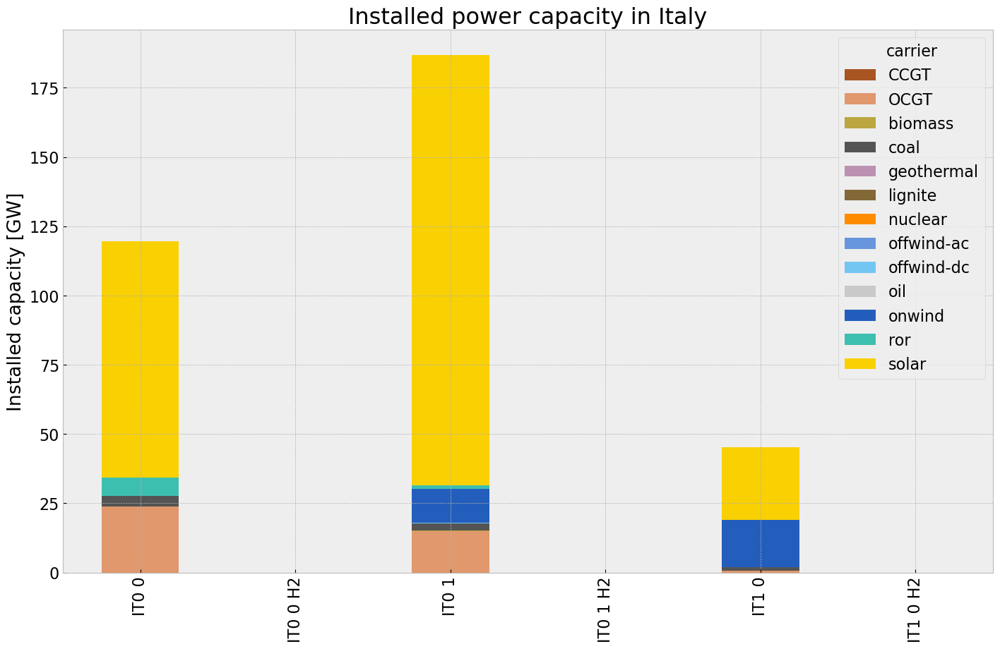

<Figure size 640x480 with 0 Axes>

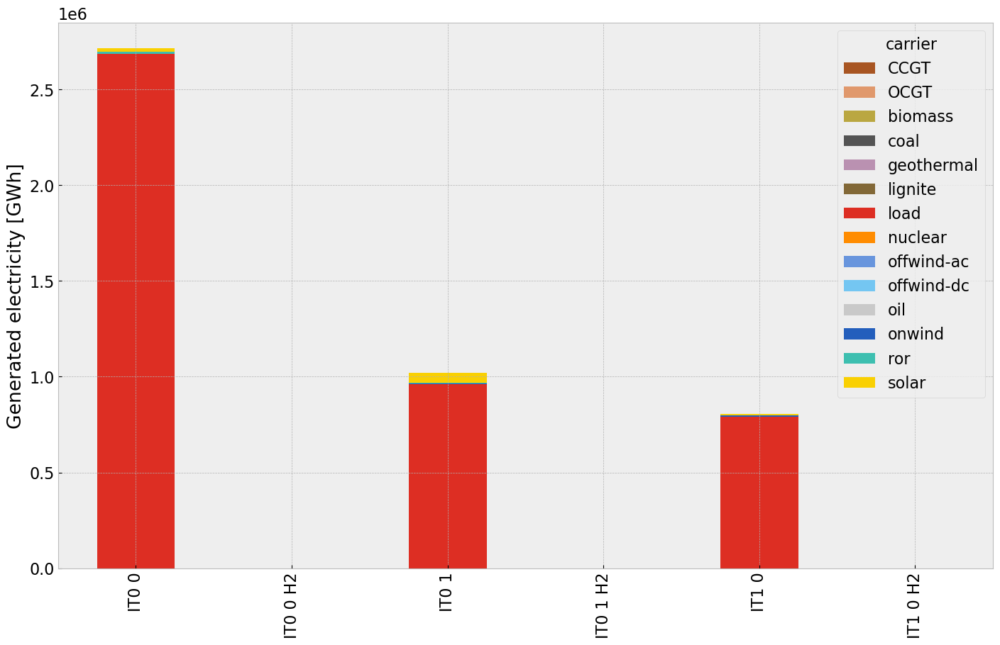

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\478108386.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\478108386.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3543934751.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axi

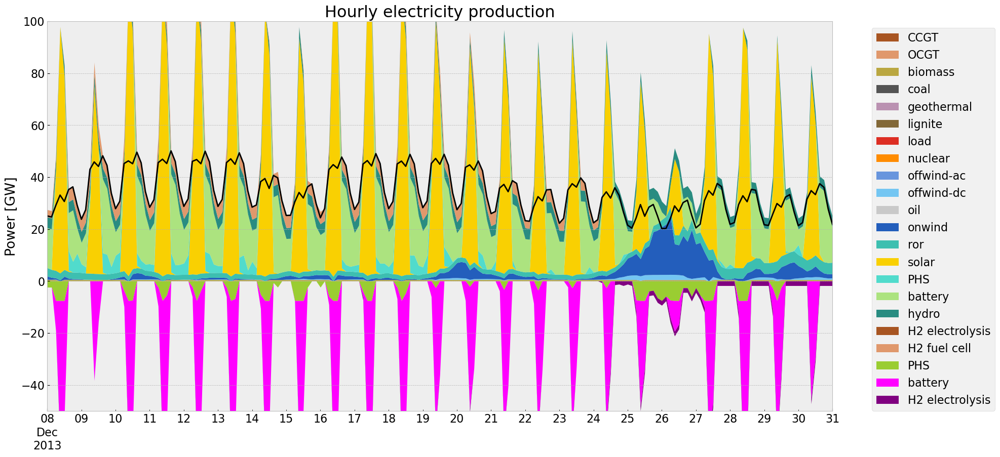

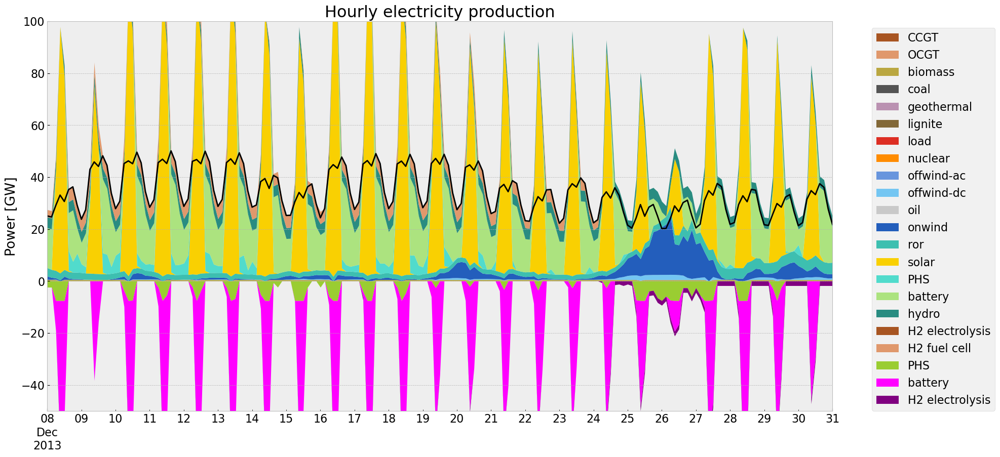

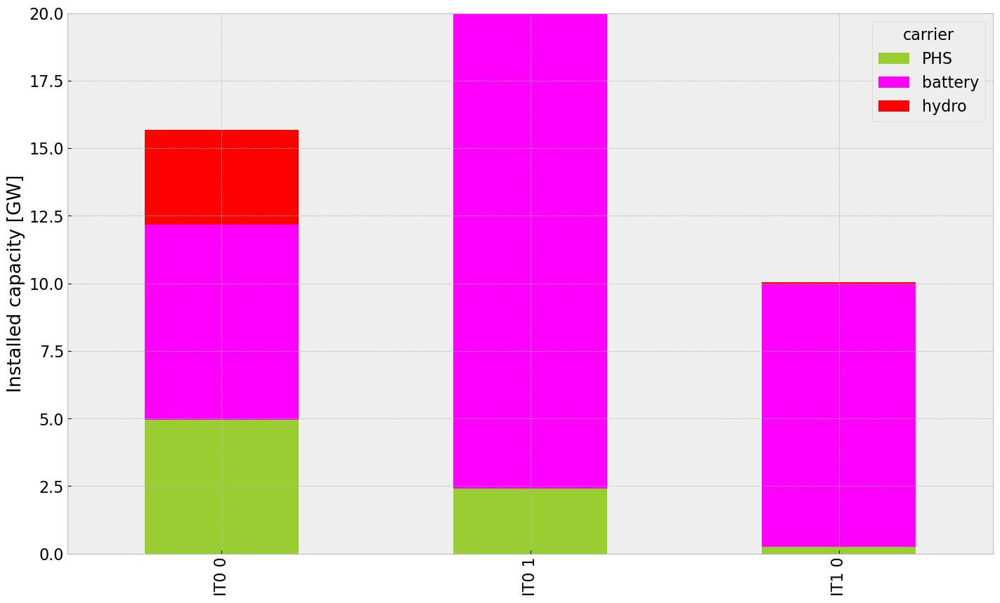

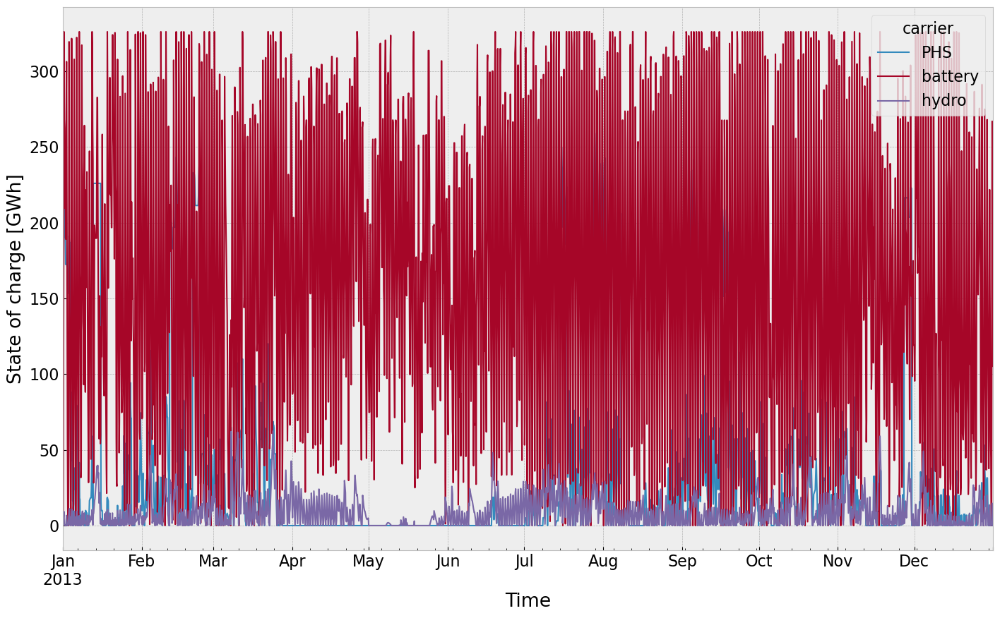

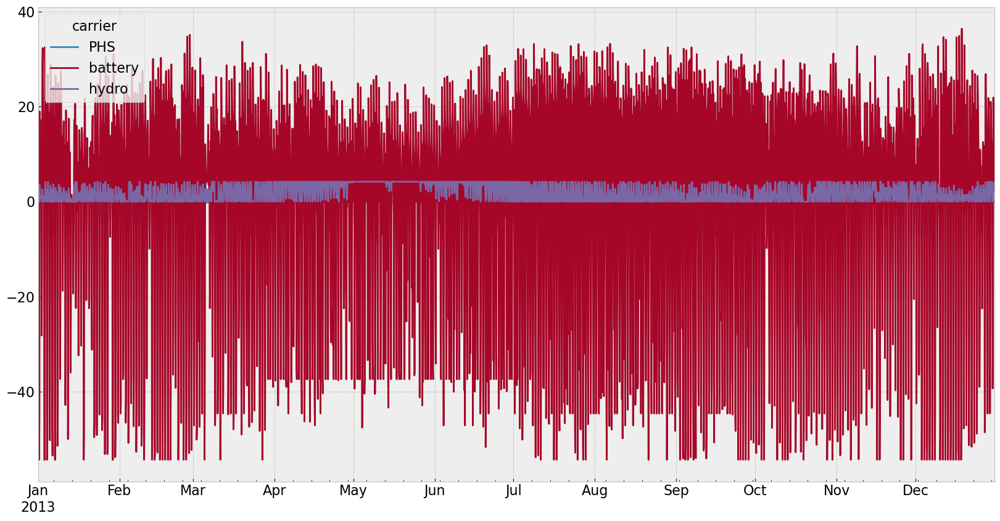

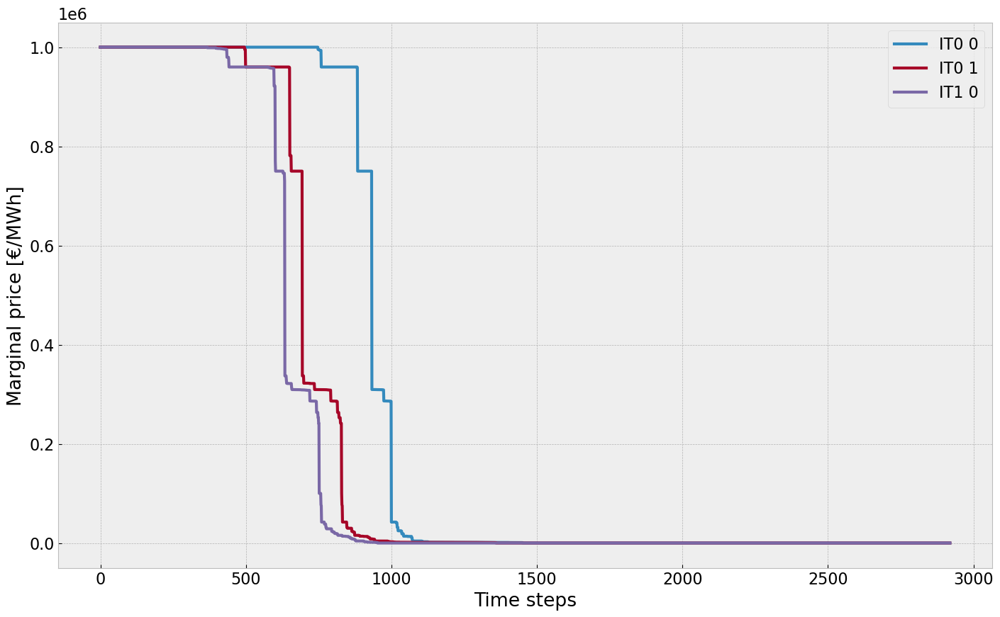

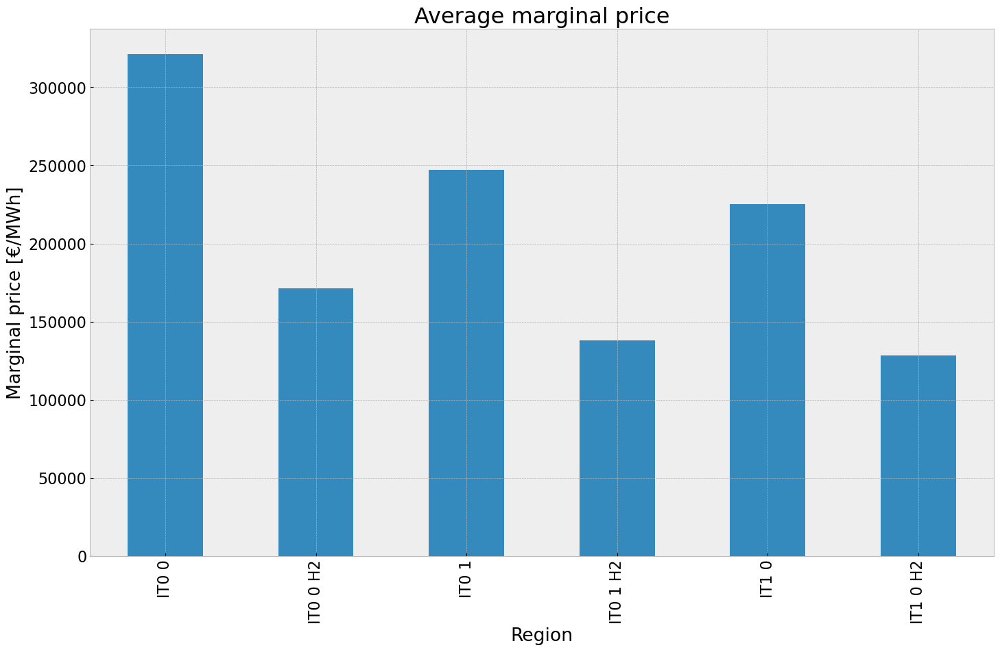

In [428]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

#installed storage unit
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)

# Scenario Analysis

## Installed Capacity

In [429]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

In [430]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,39.420200,39.420200,39.420200,39.420200
Biomass,0.508000,0.508000,0.508000,0.508000
Coal,7.275926,7.275926,7.275926,7.275926
Geothermal,0.059000,0.059000,0.059000,0.059000
Lignite,0.000000,0.000000,0.000000,0.000000
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,0.000000,0.000000,0.000000,0.000000
Offshore Wind DC,0.384920,2.292771,0.384920,0.384920


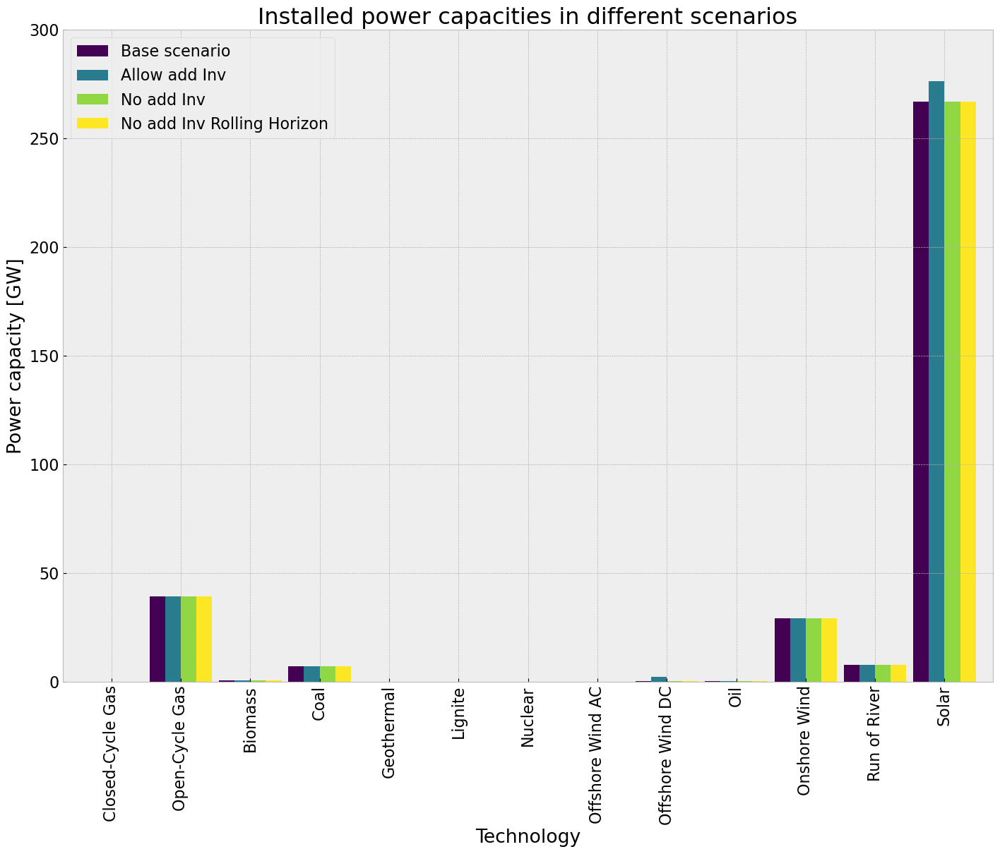

In [431]:
#colors = cm.viridis(np.linspace(0, 5, len(comp_inst_cap)))

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        ylim=[0,300],
                        width=0.9
)
plt.show()

## Power Generation

In [432]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)

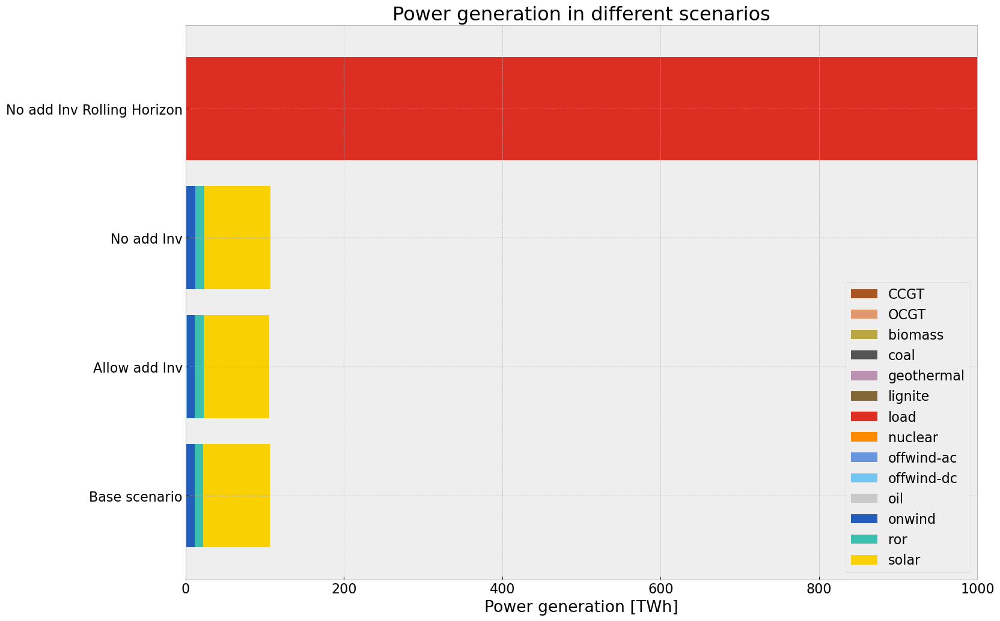

In [433]:
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        xlim=[0,1000],
                        width=0.8
)
plt.show()

## Average System Cost

In [434]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

if 'AC' in system_cost_base:
    comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\2925963551.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  comp_system_cost.fillna(0, inplace=True)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\649005694.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\649005694.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


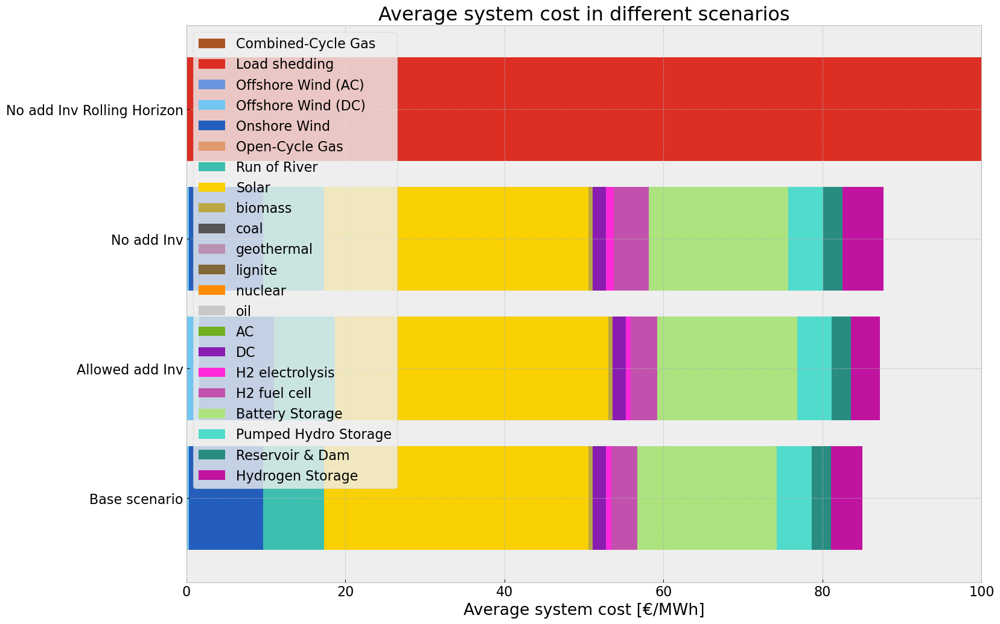

In [435]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        xlim=[0,100],
                        width=0.8
)
plt.show()

## Curtailment

In [436]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [437]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_7040\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


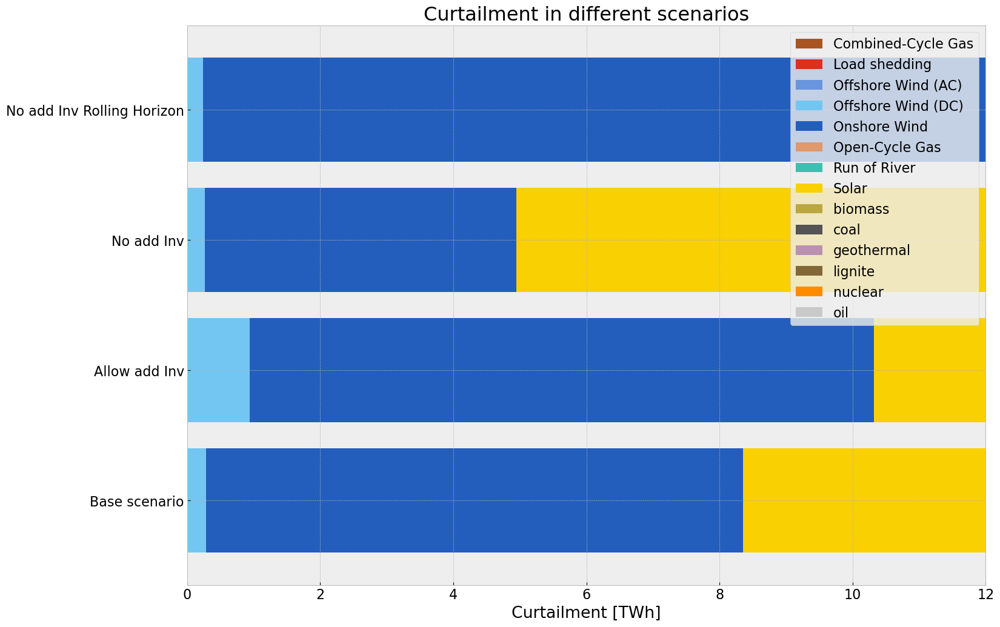

In [438]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        xlim=[0,12],
                        width=0.8
)
plt.show()